# Step 3 - working with C2L outputs, Loading and working with processed Visium data Paediatric

In [1]:
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
import pickle as pkl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import re
import os
import scipy.stats
from numpy import asarray as ar
from collections import Counter
import scvi

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

from datetime import date
today = str(date.today())
sc.settings.verbosity = 1
sc.logging.print_version_and_date()
%load_ext autoreload
%autoreload 2

Global seed set to 0


Running Scanpy 1.9.1, on 2023-07-08 20:47.


In [2]:
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')

In [3]:
## For correct plotting of the images
import matplotlib
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42

In [4]:
import os
os.getcwd()

'/nfs/team205/ny1/ThymusSpatialAtlas/Figure2'

In [5]:
adata_paed = sc.read("/nfs/team205/vk8/projects/thymus_atlas/results/thymus_atlas_v2_anno_v9_paed_sub/cell2location_map/sp.h5ad")

In [6]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
# to adata.obs with nice names for plotting
adata_paed.obs[adata_paed.uns['mod']['factor_names']] = adata_paed.obsm['q05_cell_abundance_w_sf']
adata_paed.obs['tot_cell_abundance'] = adata_paed.uns["mod"]["post_sample_means"]["w_sf"].sum(1).flatten()
adata_paed.obs['detection_sensit']  = adata_paed.uns["mod"]["post_sample_q05"]["detection_y_s"]

In [7]:
# Selected nice slides for exploration 
paed_slides = ['WSSS_THYst9518030', 'TA11556493', 'TA11556495']

In [8]:
# filter object by spot coverage
adata_paed_filt = adata_paed[adata_paed.obs['tot_cell_abundance']>30,:].copy()
adata_paed_filt = adata_paed_filt[adata_paed_filt.obs['n_genes_by_counts']>800,:].copy()
adata_paed_filt

AnnData object with n_obs × n_vars = 28081 × 11988
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 'Cortico_Medullar_Axis', 'SampleID', 'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 'L2_dist_log10_Annotation_lv_1_Large vessel', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN

# embed new annotations 

In [9]:
# remove outdated annotations 
annotations_to_remove = ['L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 
                         'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 
                         'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 
                         'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 
                         'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 
                         'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 
                         'L2_dist_log10_Annotation_lv_1_Large vessel']

adata_paed_filt.obs.drop(columns=annotations_to_remove, errors='ignore', inplace=True)
adata_paed_filt.obs.rename(columns={'Cortico_Medullar_Axis': 'cma_v1'}, inplace=True)

adata_paed_filt

AnnData object with n_obs × n_vars = 28081 × 11988
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cma_v1', 'SampleID', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN/DV200', 'Spatial_type', 'DonorID', 'Donor_type', 'Age_group', 'Age(misc)', 'Age(numeric)', 'Source', 'Sex', 'QC', 'Batch', 'CMA version ', 'Spaceranger', 'Comments', 'Medians Genes per Spot (>1500)', 'Mean Reads per spot ', 'Median UMI per spot ', 'Usefull region out of tissue (>30%)', 'Tissue Morphology ', 'Spots under tissue', 'Fraction of reads in tissue', 'Sample Rank', 'original_image_name', 'old_sample_name', 'annotation_type', 'uploaded_annotated', 'annotated_path', '_indices', '_scvi_batch', '_scvi_labels', 'B(P)', 'B(Q)', 'B-stimulated', 'DC-Prolif', 'DC-a1', 'DC-a3', 'DC1'

In [10]:


# load the CSV file into a dataframe
df = pd.read_csv('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/HTSA_All_Spatial_Data_v3 - visium.csv')

# load the large anndata object
large_adata = adata_paed_filt.copy()

# iterate over the dataframe rows
for index, row in df.iterrows():
    # load the anndata object from the path
    adata = sc.read_h5ad(row['path']+'/adata_cma_v2.h5ad')
    dtypes = adata.obs.dtypes
    # prepend SampleID to cell barcodes
    adata.obs_names = row['SampleID'] + '-' + adata.obs_names
    
    # calculate the number of matching cells
    matching_cells = large_adata.obs.index.intersection(adata.obs.index)
    matching_cells_num = matching_cells.shape[0]
    total_cells = adata.n_obs
    print(f"Number of matching cells for {row['path']}: {matching_cells_num} out of {total_cells}")

    # update the annotations for the cells
    for col in adata.obs.columns:
        if col not in large_adata.obs.columns:
            # if the column doesn't exist in the large anndata object, add it
            large_adata.obs[col] = pd.Series(data=np.nan, index=large_adata.obs.index)
        # if the column exists in the large anndata object, update the relevant cells
        if str(dtypes[col]) == 'category':
            large_adata.obs[col] = large_adata.obs[col].astype('object') 
            large_adata.obs.loc[matching_cells, col] = adata.obs.loc[matching_cells, col]
            large_adata.obs[col] = large_adata.obs[col].astype('category') 
        else:
            large_adata.obs.loc[matching_cells, col] = adata.obs.loc[matching_cells, col]

adata_paed_filt = large_adata


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486161: 1004 out of 4963


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486162: 1738 out of 4991


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486163: 2153 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486164: 1565 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556492: 2343 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556493: 2679 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556494: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556495: 2451 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556496: 2164 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp10864183: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604685: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604686: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604687: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604688: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604689: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604690: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11765867: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11765868: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11765870: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp9838711: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp9838716: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142086: 1295 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142087: 1241 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142088: 1941 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142089: 2013 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9518030: 2251 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9518032: 1542 out of 4992


In [13]:
adata_paed_filt

View of AnnData object with n_obs × n_vars = 25107 × 11988
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cma_v1', 'SampleID', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN/DV200', 'Spatial_type', 'DonorID', 'Donor_type', 'Age_group', 'Age(misc)', 'Age(numeric)', 'Source', 'Sex', 'QC', 'Batch', 'CMA version ', 'Spaceranger', 'Comments', 'Medians Genes per Spot (>1500)', 'Mean Reads per spot ', 'Median UMI per spot ', 'Usefull region out of tissue (>30%)', 'Tissue Morphology ', 'Spots under tissue', 'Fraction of reads in tissue', 'Sample Rank', 'original_image_name', 'old_sample_name', 'annotation_type', 'uploaded_annotated', 'annotated_path', '_indices', '_scvi_batch', '_scvi_labels', 'B(P)', 'B(Q)', 'B-stimulated', 'DC-Prolif', 'DC-a1', 'DC-a3

In [20]:
adata_paed_filt.obs['annotation_figure_1'] = adata_paed_filt.obs['annotations_level_0']
adata_paed_filt.obs['annotation_figure_1'] = adata_paed_filt.obs['annotation_figure_1'].astype('object')
adata_paed_filt.obs.loc[np.array(adata_paed_filt.obs['annotations_level_0'].isin(['Edge'])) ,'annotation_figure_1'] = "Capsule/Septa"
adata_paed_filt.obs.loc[np.array(adata_paed_filt.obs['annotations_level_1'].isin(['HS'])) ,'annotation_figure_1'] = "Hassal's"
adata_paed_filt.obs.loc[np.array(adata_paed_filt.obs['annotations_level_1'].isin(['PVS'])) ,'annotation_figure_1'] = "Perivascular Space"
adata_paed_filt.obs.loc[np.array(adata_paed_filt.obs['annotations_level_0'].isin(['Fat'])) ,'annotation_figure_1'] = "Adipose"

adata_paed_filt.obs['annotation_figure_1'] = adata_paed_filt.obs['annotation_figure_1'].astype('category')
adata_paed_filt = adata_paed_filt[adata_paed_filt.obs['annotation_figure_1']!='Artifacts']
adata_paed_filt = adata_paed_filt[adata_paed_filt.obs['annotation_figure_1']!='Background']
adata_paed_filt = adata_paed_filt[adata_paed_filt.obs['annotation_figure_1']!='Unassigned']
adata_paed_filt = adata_paed_filt[adata_paed_filt.obs['annotation_figure_1'].notna()]

adata_paed_filt.obs['annotation_figure_1'].value_counts(dropna=False)
ct_order = ["Capsule/Septa",'Cortex','Medulla',"Hassal's Corpuscules","Perivascular Space",'Adipose']

# adata_paed_filt.obs['annotation_figure_1'] = adata_paed_filt.obs['annotation_figure_1'].cat.reorder_categories(ct_order)
import seaborn as sns
sns.set_palette('colorblind')
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette('colorblind'))[range(len(ct_order))]))

/tmp/ipykernel_299/3139531044.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_paed_filt.obs['annotation_figure_1'] = adata_paed_filt.obs['annotations_level_0']


Cortex                15816
Medulla                6057
Capsule/Septa          2783
Perivascular Space      252
Hassal's                199
Name: annotation_figure_1, dtype: int64

In [314]:
# perform SCVI - batch correction 
adata_tmp = adata_paed_filt.copy()
cc_genes =  ['C1orf112', 'KDM1A', 'ARHGAP33', 'CDC27', 'AC004381.6', 'DBF4', 'PRSS21', 'E2F2', 'BAZ1B', 'NCAPD2', 'ANLN', 'BRCA1', 'UBR7', 'DDX11', 'TACC3', 'POLA2', 'DEPDC1', 'NCAPH2', 'HMGB3', 'CENPQ', 'DEPDC1B', 'SPDL1', 'TDP1', 'DSG2', 'NOP16', 'RFC2', 'RAD51', 'POLQ', 'THOC3', 'MRTO4', 'C4orf27', 'POLD1', 'TM7SF3', 'MCM10', 'MTHFD2', 'YBX1', 'ASPM', 'PRR11', 'NUCKS1', 'EXOC5', 'TCOF1', 'RAD18', 'TRIP13', 'DAZAP1', 'HLTF', 'PDCD2', 'SMC1A', 'HMMR', 'MCM2', 'NUP37', 'GTSE1', 'WDR62', 'MCM6', 'MLH1', 'UNG', 'SPAG5', 'UBE2T', 'EXOSC5', 'FAM76B', 'POLD3', 'KIF22', 'PUM3', 'RBL1', 'NDC80', 'HSPB11', 'OXCT1', 'SEH1L', 'ORC1', 'RAD54L', 'NOP14', 'GMCL1', 'AURKA', 'TPX2', 'BIRC5', 'KIF4A', 'FH', 'ORC6', 'G2E3', 'WDR76', 'PHGDH', 'CLSPN', 'NUP50', 'CDC45', 'CDC6', 'CBX5', 'MSH2', 'FKBP5', 'ACOT7', 'CDC7', 'RANBP1', 'CENPM', 'HMGXB4', 'MCM5', 'RANGAP1', 'POLE2', 'CDKN3', 'ERH', 'MTHFD1', 'VRK1', 'EMC9', 'GINS1', 'MYBL2', 'CDC25B', 'PLCB4', 'FAM83D', 'CEP76', 'RBBP8', 'POLA1', 'NUP93', 'CTCF', 'CCP110', 'CEP152', 'OIP5', 'MYEF2', 'MCM4', 'KCTD9', 'RNASEH2A', 'SGTA', 'ASF1B', 'LIG1', 'H2AFV', 'GARS', 'NUDT1', 'RPA3', 'EZH2', 'RHEB', 'SMC3', 'UBE2S', 'RAD51C', 'GALK1', 'C1QBP', 'BLMH', 'TMEM97', 'GAR1', 'NEIL3', 'WHSC1', 'NCAPG', 'CCDC34', 'CCDC86', 'MAGOHB', 'FOXM1', 'GPN3', 'RAD51AP1', 'RFC5', 'NUP107', 'TIMELESS', 'GAPDH', 'CDCA3', 'ENO2', 'FBXO5', 'MCM3', 'BAG2', 'GMNN', 'TTK', 'HMGCS1', 'BRD8', 'KIF20A', 'LMNB1', 'NUP155', 'H2AFY', 'SMC4', 'ECT2', 'CENPA', 'FHL2', 'MSH6', 'DHCR24', 'LRRC42', 'WDR77', 'SRM', 'MAD2L2', 'UCHL5', 'TTF2', 'SLC2A1', 'EBNA1BP2', 'CDC20', 'STMN1', 'NEK2', 'CENPF', 'KIF14', 'CASP8AP2', 'CTNNAL1', 'WDR34', 'PHF19', 'ACYP1', 'EPCAM', 'HELLS', 'CENPL', 'ACAT2', 'MASTL', 'EXOSC8', 'TMPO', 'NFYB', 'NCAPH', 'MND1', 'KIF18A', 'GPSM2', 'GTF3A', 'MRPS2', 'CCDC18', 'CISD1', 'ZWINT', 'CIT', 'DDX39A', 'CENPK', 'CDK2', 'TUBA1B', 'STIL', 'HJURP', 'EXOSC9', 'CKS2', 'ACSL3', 'CSE1L', 'HIST1H1D', 'HIST1H1A', 'DEK', 'GOT2', 'MGME1', 'MCM8', 'HNRNPR', 'BCL2L12', 'TRAP1', 'DLGAP5', 'YEATS4', 'PKMYT1', 'SRD5A3', 'PAICS', 'HAT1', 'KNSTRN', 'DUT', 'E2F8', 'FAM64A', 'MIS18BP1', 'SGOL1', 'RPS4Y1', 'LDLR', 'TOMM40', 'ATP8B3', 'LSM4', 'DNMT1', 'GINS2', 'TUBG1', 'PSMC3IP', 'THOC6', 'TOP2A', 'ENOSF1', 'RAN', 'RPA1', 'PCNA', 'NASP', 'RFC3', 'SLF1', 'LRRCC1', 'CCNB1', 'PSRC1', 'TMEM106C', 'LDHA', 'DDB2', 'CDCA8', 'TPGS2', 'SLC43A3', 'C9orf40', 'TROAP', 'ESPL1', 'NTPCR', 'CKAP2', 'BORA', 'NUDT15', 'BRIP1', 'ACTL6A', 'TXN', 'ODF2', 'SMC2', 'CDK5RAP2', 'ANP32B', 'DSCC1', 'ARHGEF39', 'PPIL1', 'TCF19', 'NRM', 'GGH', 'BUD13', 'CTDSPL2', 'NUSAP1', 'KIF23', 'CASC5', 'CENPO', 'KIF11', 'CEP55', 'KIF20B', 'DNA2', 'BARD1', 'MNS1', 'ZGRF1', 'CENPE', 'HADH', 'SLC39A8', 'NEDD1', 'BRCA2', 'DIAPH3', 'PIF1', 'FANCI', 'TICRR', 'SAMD1', 'SAE1', 'PLK4', 'ITGB3BP', 'KIF2C', 'UCK2', 'NUF2', 'ANP32E', 'DTL', 'ILF2', 'C1orf35', 'HNRNPLL', 'CHAC2', 'POLR2D', 'CDCA7', 'FANCD2', 'CCNA2', 'SKP2', 'PRIM2', 'MMS22L', 'PM20D2', 'MTFR2', 'CDCA5', 'NCAPG2', 'PRPS1', 'GINS4', 'HAUS6', 'CEP78', 'GTF3C5', 'MKI67', 'IMMP1L', 'SSRP1', 'INCENP', 'CCDC15', 'CHEK1', 'DSN1', 'HIRIP3', 'HMGA2', 'TEX30', 'NCAPD3', 'CENPU', 'CENPJ', 'SPC25', 'SUV39H2', 'CENPH', 'CARHSP1', 'CLGN', 'CCSAP', 'BUB3', 'SLFN13', 'SKA1', 'SLC16A1', 'TMEM237', 'ADK', 'FAM122B', 'AIFM1', 'ATAD2', 'SASS6', 'BUB1B', 'CCNB2', 'PSMG3', 'FAIM', 'CDC25C', 'MIS18A', 'ATP5G1', 'IGF2BP1', 'CHAF1B', 'NAE1', 'CCDC58', 'C21orf58', 'ZNF714', 'GPATCH4', 'YDJC', 'RACGAP1', 'SPC24', 'POLR3K', 'CCNF', 'ASRGL1', 'USP1', 'KIAA1524', 'SGOL2', 'TOPBP1', 'KIF15', 'WDR43', 'RFC4', 'RPL39L', 'RNF168', 'H2AFZ', 'CDC25A', 'POC1A', 'HMGB2', 'MAD2L1', 'PTTG1', 'RAD21', 'PSIP1', 'GKAP1', 'MELK', 'SLC7A3', 'SKA3', 'LRR1', 'HPRT1', 'E2F7', 'JAM3', 'BRD7', 'CENPN', 'LEO1', 'WEE1', 'MCM7', 'CENPV', 'SAAL1', 'FAM111A', 'KIAA0101', 'PLK1', 'XRCC6BP1', 'SNRPD1', 'RRM1', 'CDT1', 'CHAF1A', 'C19orf48', 'NUDT8', 'PRDX2', 'TK1', 'SAC3D1', 'PBK', 'HIST1H1E', 'DTYMK', 'RFWD3', 'FEN1', 'ING2', 'CDKN2AIP', 'SNRNP48', 'USP39', 'CKAP2L', 'BUB1', 'ELP5', 'CDK1', 'CDCA4', 'SHCBP1', 'PGAM1', 'ESCO2', 'RHNO1', 'CTPS1', 'RRM2', 'THOP1', 'C5orf34', 'POP7', 'ZNF738', 'CKS1B', 'GMPPB', 'CNP', 'CBX2', 'C16orf91', 'EXO1', 'ZWILCH', 'ANKRD36C', 'UBE2C', 'CKAP5', 'CCNE2', 'CCDC14', 'RMI2', 'TOMM5', 'RUVBL1', 'ATAD5', 'LMNB2', 'TYMS', 'PXMP2', 'SHMT1', 'POLE', 'PAWR', 'PIDD1', 'GSG2', 'GEN1', 'RMI1', 'AURKB', 'RCC1', 'PPA1', 'HIST3H2A', 'MRPS23', 'RTKN2', 'IDH2', 'KPNA2', 'CEP97', 'GLRX5', 'SKA2', 'CEP57L1', 'PSMG1', 'SFXN4', 'ALYREF', 'TRAIP', 'LIN9', 'KMT5A', 'PGP', 'CMSS1', 'HIST2H2AC', 'HIST1H1B', 'KNTC1', 'CDCA2', 'H1FX', 'SIVA1', 'PARPBP', 'KIF18B', 'ERCC6L', 'PTMA', 'HSPA14', 'FANCA', 'ARHGAP11B', 'TUBB4B', 'CENPP', 'H2AFX', 'FAM72B', 'FAM221A', 'FAM111B', 'HN1', 'HMGB1', 'TUBB', 'IARS', 'ERI2', 'HIST1H4C', 'BLM', 'PRIM1', 'HMGN5', 'SVIP', 'TFDP1', 'TXNRD1', 'WDHD1', 'EIF1AY', 'ARHGAP11A', 'HMGN2', 'DCAF12', 'PRC1', 'CCDC167', 'CENPW', 'GPANK1', 'MZT1', 'C4orf46', 'KLHL23', 'MXD3', 'DNAJC9', 'IFRD2', 'CKLF', 'FANCG', 'DHFR', 'DLEU2', 'AP000251.3', 'KIFC1', 'CRNDE', 'C8orf88', 'PRKDC', 'BOP1', 'RP11-196G18.23', 'CTC-260E6.6', 'NCBP2-AS2', 'HIST1H3G', 'HIST1H2AH', 'UHRF1', 'RDM1', 'HIST1H2AM']
def remove_selected_genes(adata,lst,remove_also_mt=True):
    for g in lst:
        adata = adata[:,~(adata.var_names==g)]
    if remove_also_mt:
        adata = adata[:,~(adata.var_names.str.startswith('MT-'))]
    return adata

adata_tmp = remove_selected_genes(adata_tmp,cc_genes,remove_also_mt=True)  

sc.pp.highly_variable_genes(
        adata_tmp,
        n_top_genes=5000,
        subset=True,
        # Level='counts',
        flavor="seurat_v3",
        batch_key='SampleID',
        span=1,
    )
import re

for i in adata_tmp.var.index:
    if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
        adata_tmp.var.at[i, 'highly_variable'] = False
adata_tmp = adata_tmp[:,adata_tmp.var.highly_variable]
adata_tmp = adata_tmp.copy()
import warnings
warnings.filterwarnings('once')
scvi.model.SCVI.setup_anndata(adata_tmp, batch_key='SampleID', \
                        categorical_covariate_keys=['SlideID','Spaceranger','section_thickness (um)'],continuous_covariate_keys=['n_genes_by_counts'])
vae = scvi.model.SCVI(adata_tmp,n_layers=2, n_latent=30)
vae.train(max_epochs=300,batch_size=2000)
adata_paed_filt.obsm["X_scVI"] = vae.get_latent_representation() # return batch corrections to original anndata
sc.pp.neighbors(adata_paed_filt, use_rep="X_scVI")
sc.tl.umap(adata_paed_filt, min_dist = 0.01, spread = 1)
sc.tl.leiden(adata_paed_filt, resolution=0.5,key_added='leiden_05')
sc.tl.leiden(adata_paed_filt, resolution=1,key_added='leiden_1')

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 300/300: 100%|██████████| 300/300 [02:58<00:00,  1.85it/s, loss=1.93e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 300/300: 100%|██████████| 300/300 [02:58<00:00,  1.68it/s, loss=1.93e+03, v_num=1]


# individual samples figure 2

NameError: name 's' is not defined

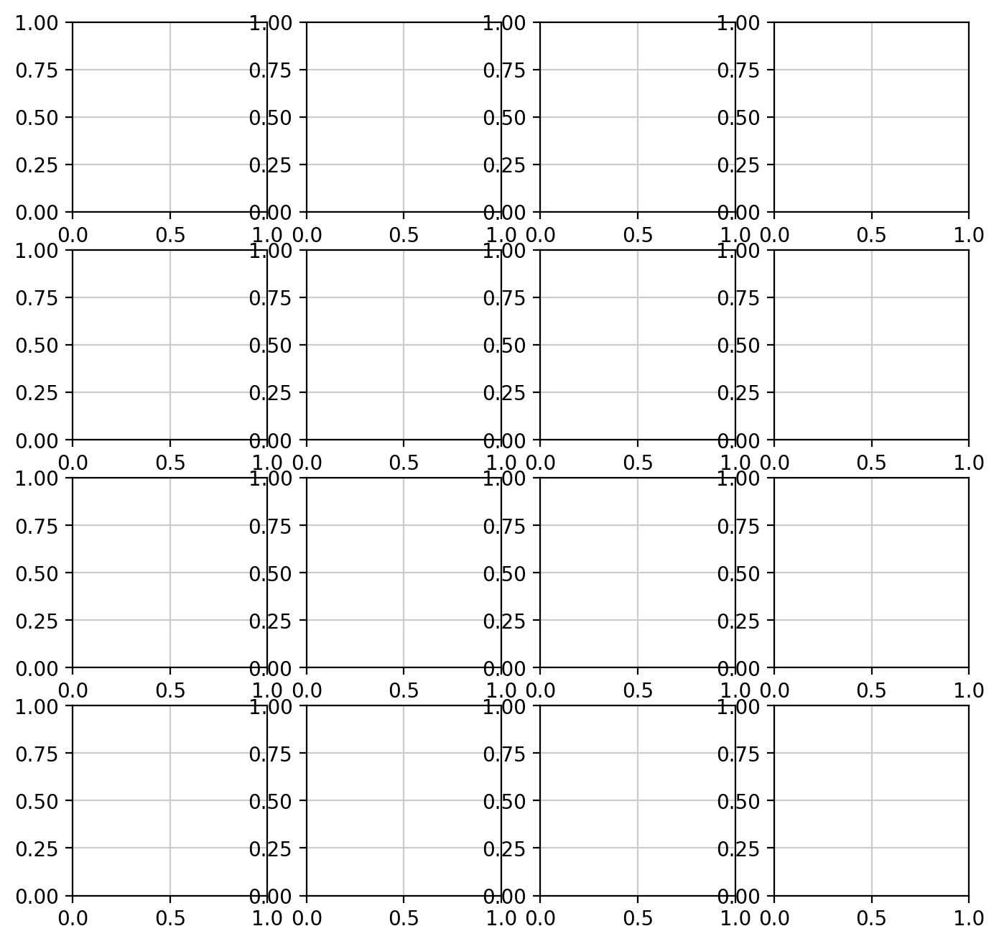

In [21]:
sc.set_figure_params(figsize=[5,5],dpi=100,fontsize=10)

# Get unique samples
samples = np.unique(adata_paed_filt.obs['SampleID'])

# Determine grid size
grid_size = int(np.ceil(np.sqrt(len(samples))))

# Create figure and axes
fig, axs = plt.subplots(grid_size, grid_size, figsize=(grid_size*2, grid_size*2))

for i, sam in enumerate(samples):
    adata = adata_paed_filt[adata_paed_filt.obs['SampleID'] == sam].copy()
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    
    # Determine subplot location
    row = i // grid_size
    col = i % grid_size

    # Use the UMAP basis for this particular sample and plot on correct axis
    sc.pl.umap(adata, color=['cma_v2'], title=s, frameon=False,
               cmap='gist_rainbow', ax=axs[row, col], show=False, vmin=-0.65, vmax=0.65,s=5)

# Remove extra subplots if number of samples is not a perfect square
if len(samples) < grid_size**2:
    for i in range(len(samples), grid_size**2):
        fig.delaxes(axs.flatten()[i])

# Show the final plot
plt.tight_layout()
plt.savefig("Paed_umap_subplots.pdf", format='pdf')
plt.show()

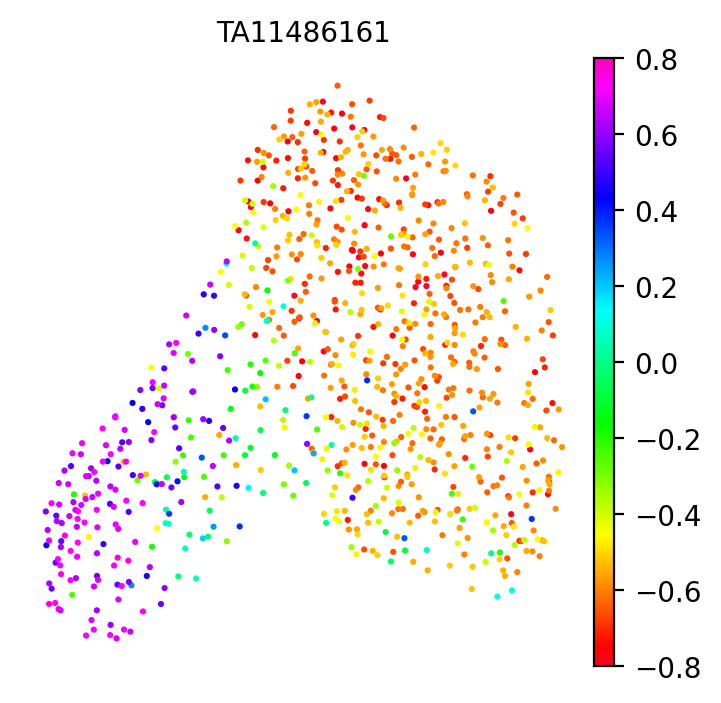

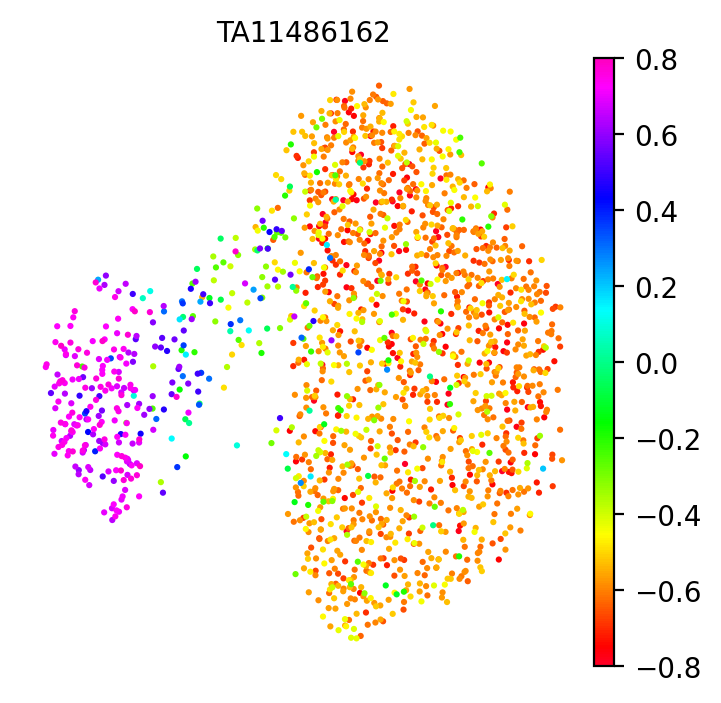

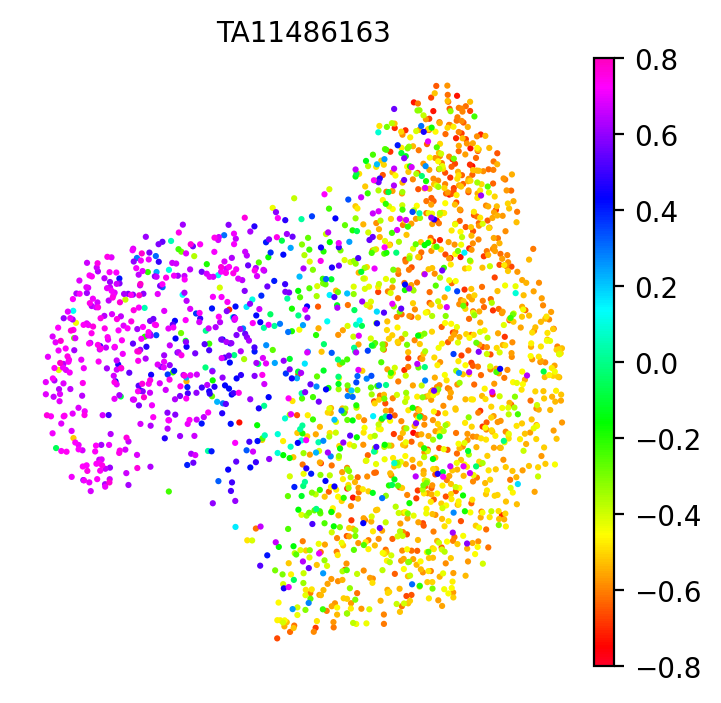

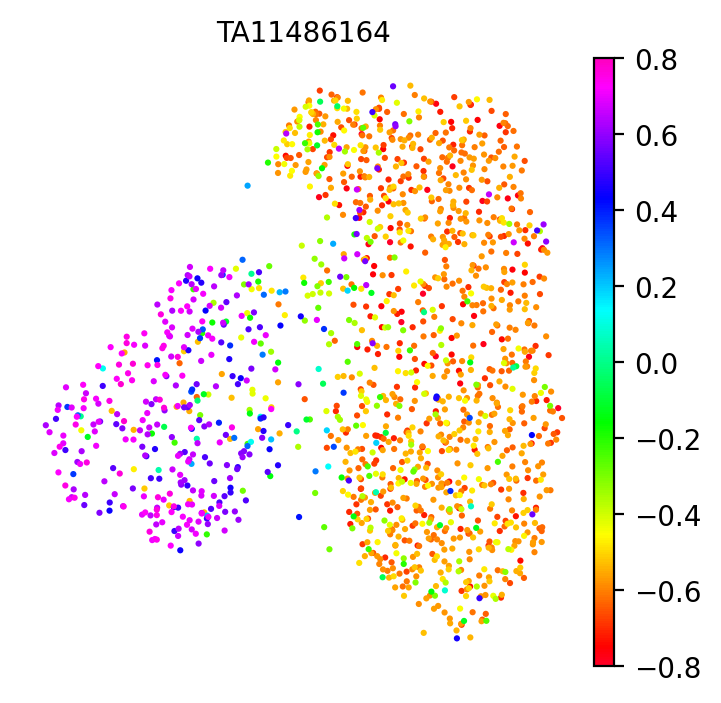

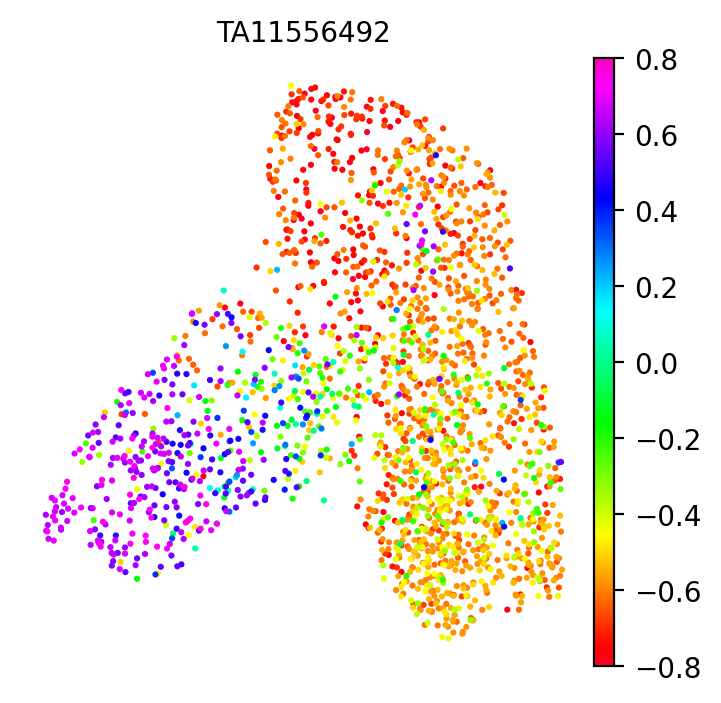

...

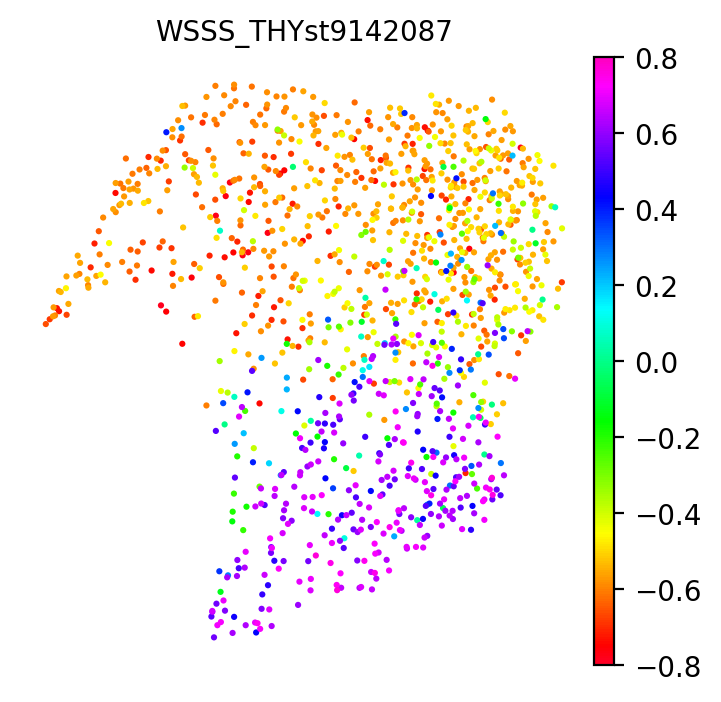

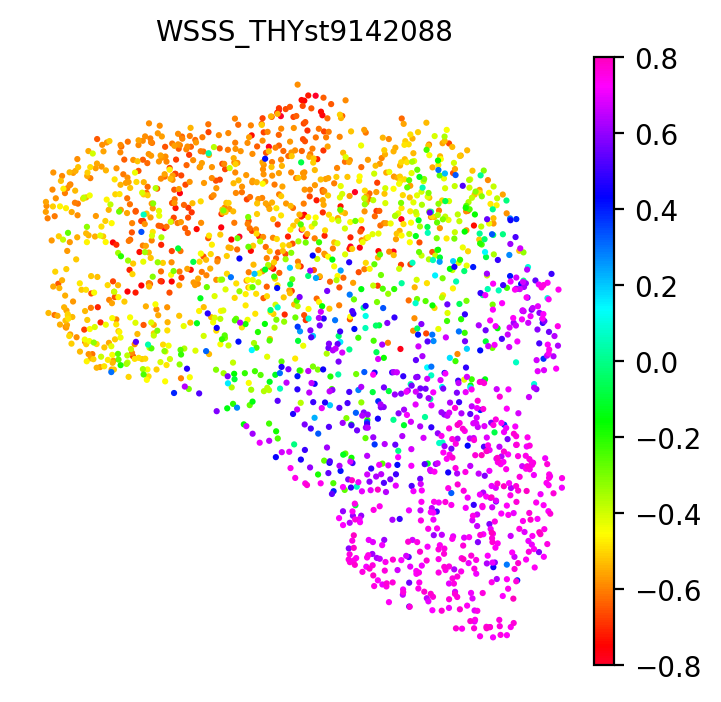

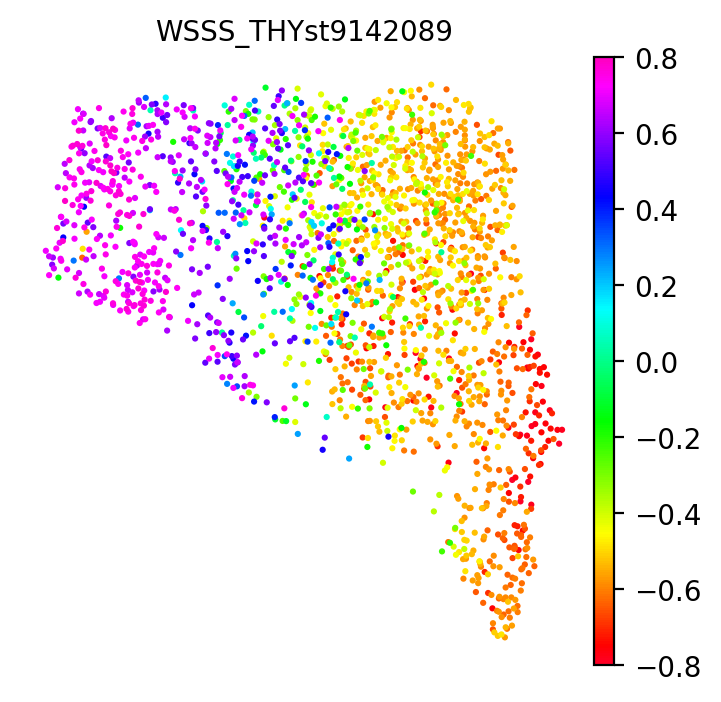

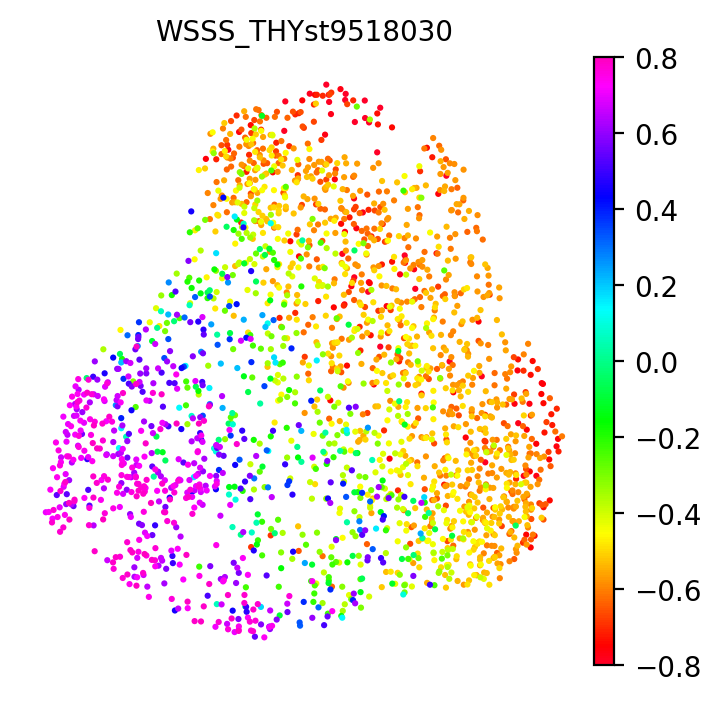

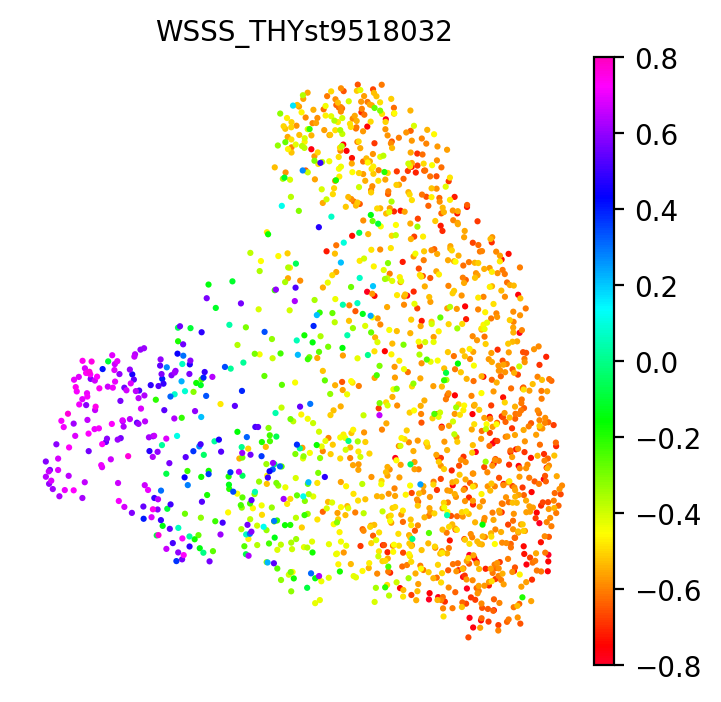

In [27]:
sc.set_figure_params(figsize=[4,4],fontsize=10,dpi=100)

for s in np.unique(adata_paed_filt.obs['SampleID']):
    adata = adata_paed_filt[adata_paed_filt.obs['SampleID']==s].copy()
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color = ['cma_v2']
           , title = s, frameon = False, cmap = 'gist_rainbow',save='_paed_sample_id'+s+'.pdf',s=20,vmin=-0.8,vmax=0.8)


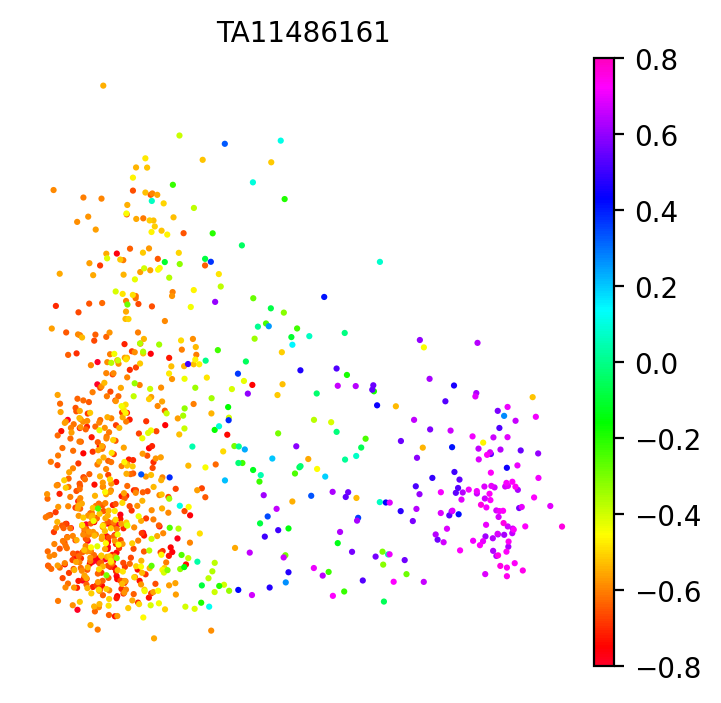

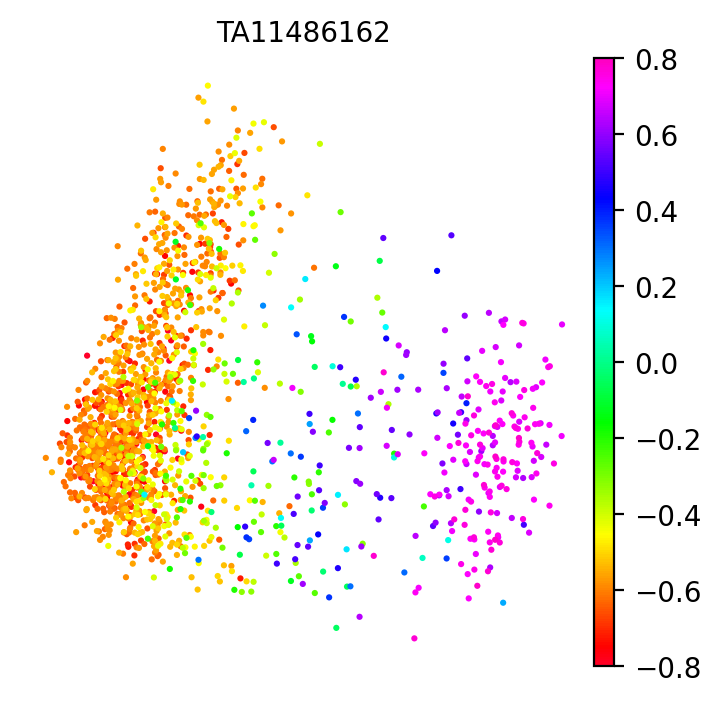

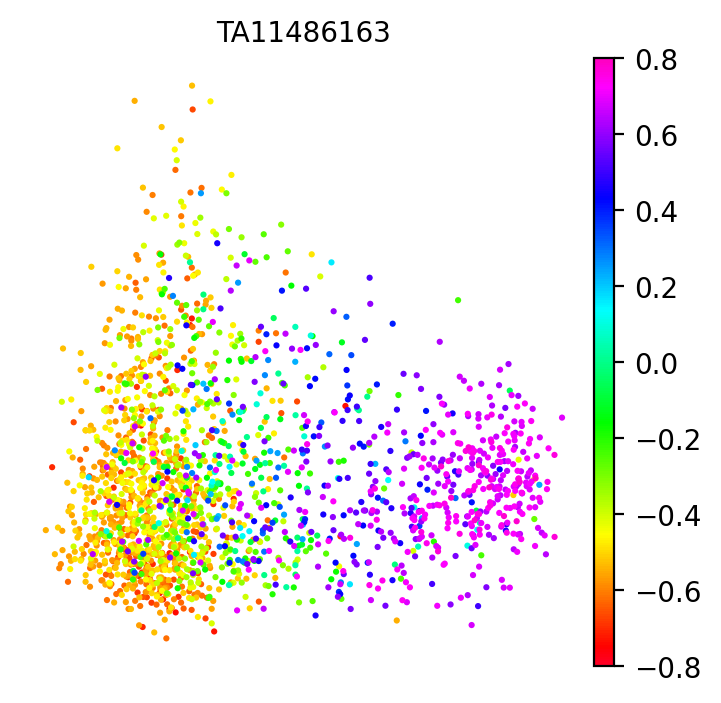

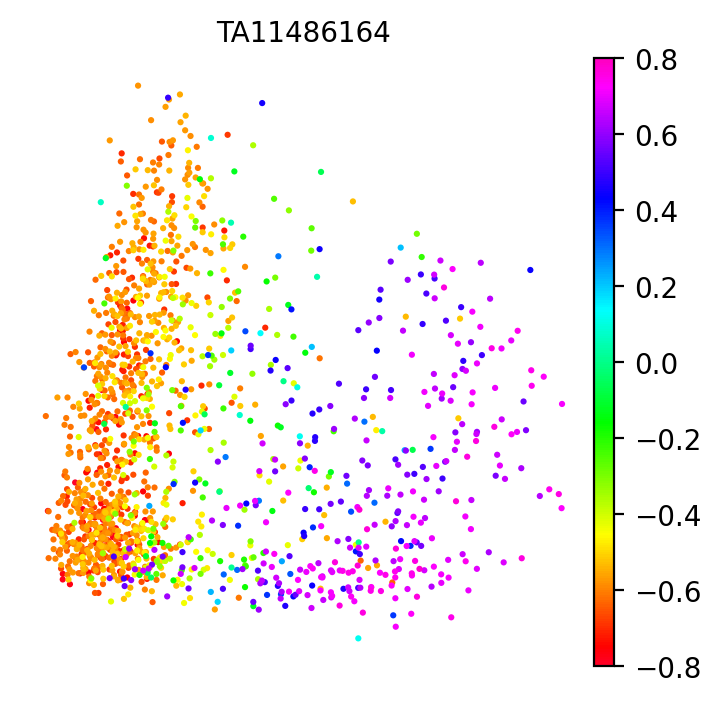

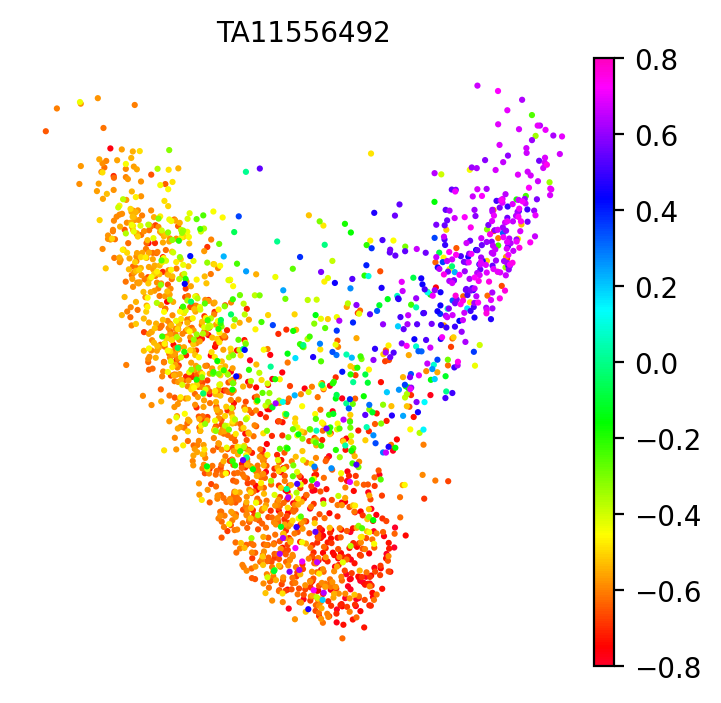

...

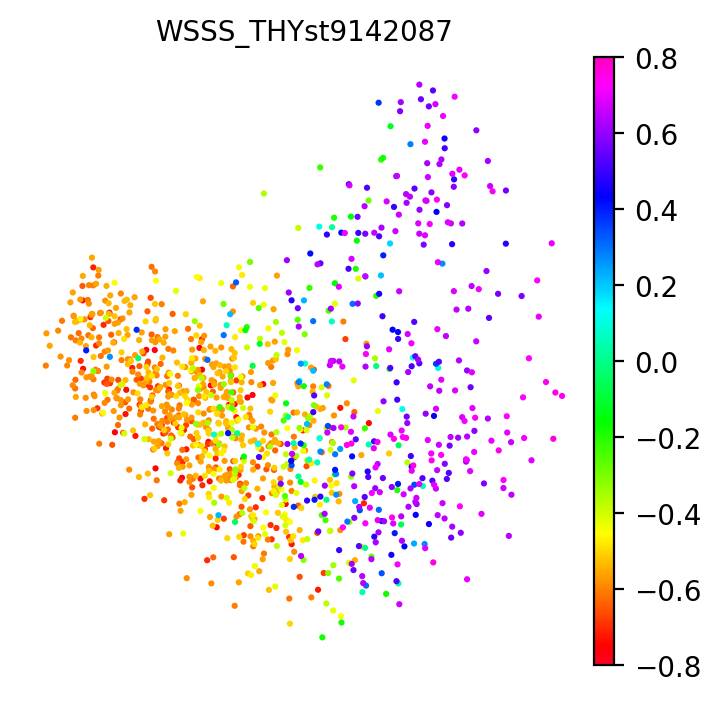

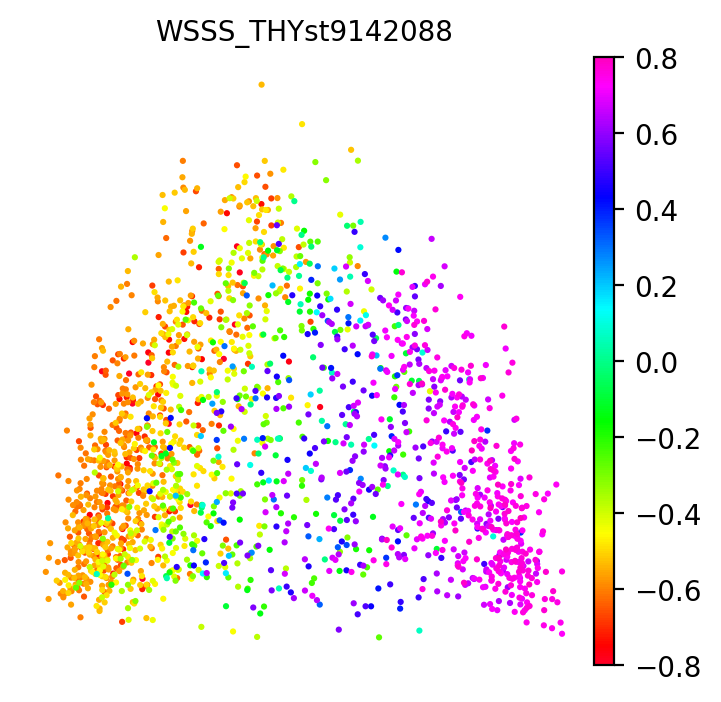

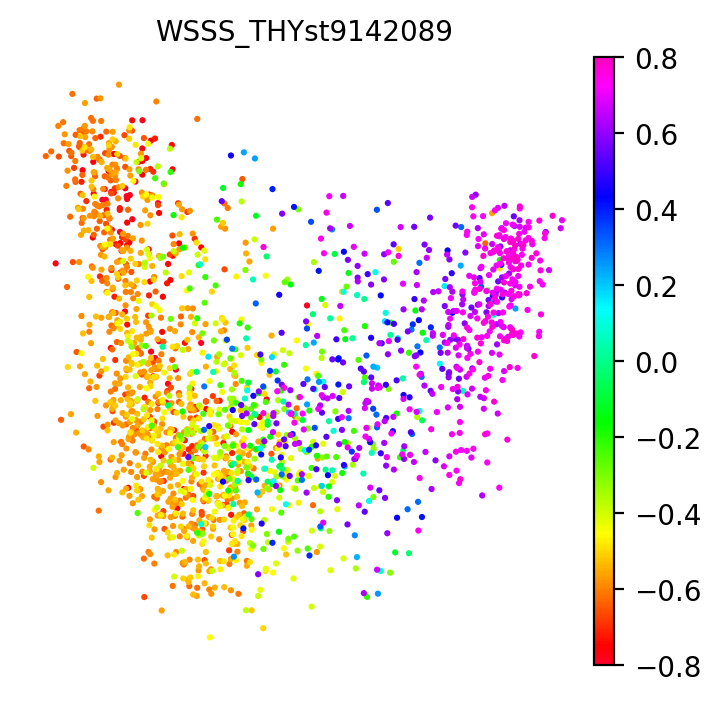

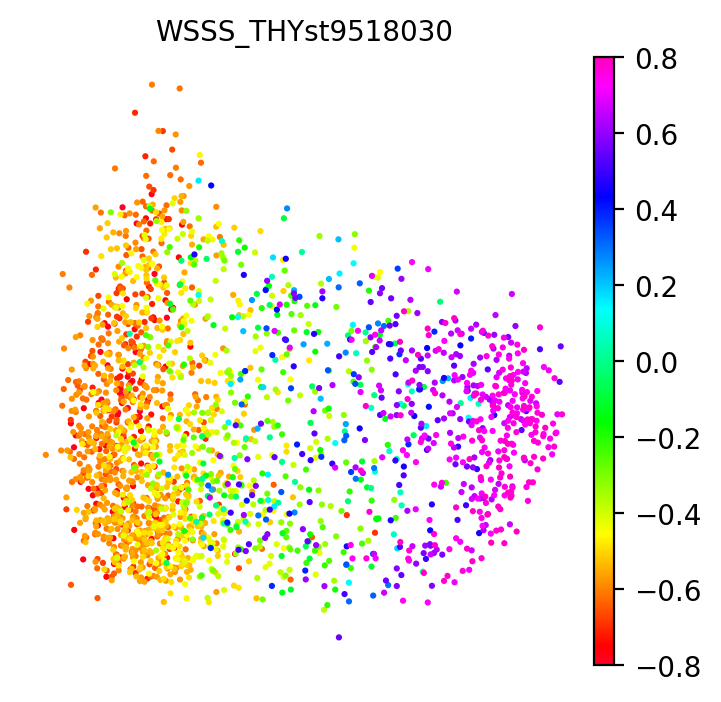

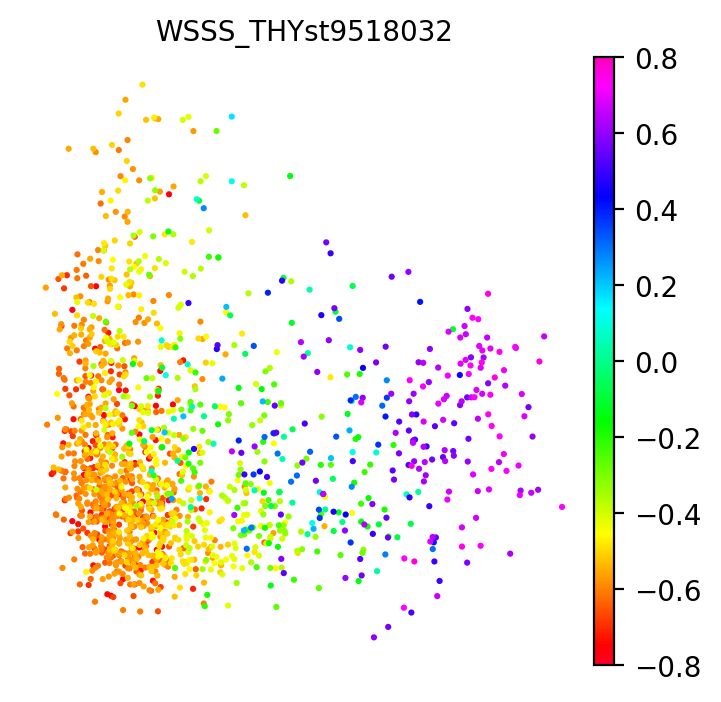

In [28]:
sc.set_figure_params(figsize=[4,4],fontsize=10,dpi=100)

for s in np.unique(adata_paed_filt.obs['SampleID']):
    adata = adata_paed_filt[adata_paed_filt.obs['SampleID']==s].copy()
    sc.pp.normalize_per_cell(adata)
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pl.pca(adata, color = ['cma_v2']
           , title = s, frameon = False, cmap = 'gist_rainbow',save='_paed_sample_id'+s+'.pdf',s=20,vmin=-0.8,vmax=0.8)


In [ ]:
sc.set_figure_params(figsize=[5,5],fontsize=20,dpi=200)
sc.pl.umap(adata_fet_filt, color = ['Annotation_lv_0'],groups = anno
           , frameon = False, cmap = 'viridis',save='_paed_Annotation_lv_0.pdf',s=5)


/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


/tmp/ipykernel_51978/2165644208.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_adata.obs.L2_dist_Annotation_lv_0_Edge.loc[adata_paed_filt.obs.L2_dist_Annotation_lv_0_Edge>300] = 300
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:444: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


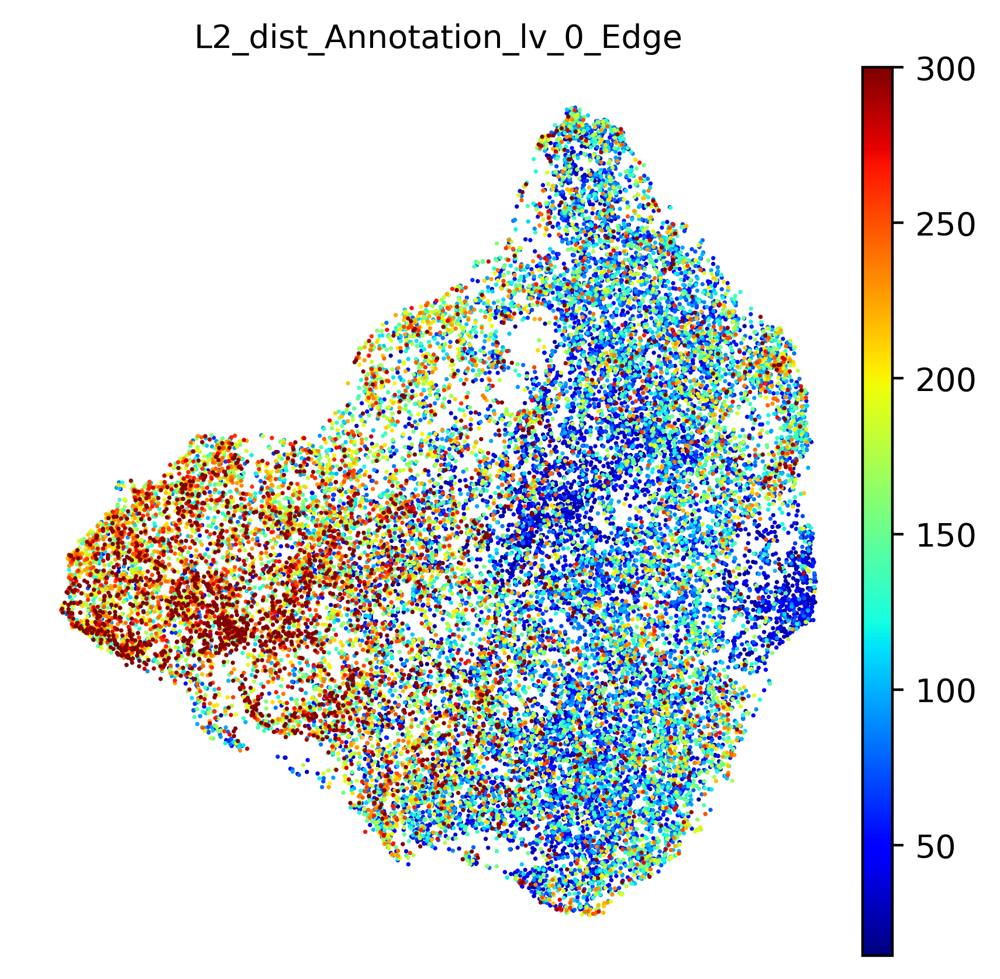

In [89]:
sc.set_figure_params(figsize=[5,5],fontsize=10,dpi=200)
tmp_adata = adata_paed_filt.copy()
tmp_adata.obs.L2_dist_Annotation_lv_0_Edge.loc[adata_paed_filt.obs.L2_dist_Annotation_lv_0_Edge>300] = 300

sc.pl.umap(tmp_adata, color = ["L2_dist_Annotation_lv_0_Edge"]
           , frameon = False, cmap = 'jet',save='_paed_L2_edge.pdf',s=7)

In [95]:
adata_paed_filt.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_paed_filt_v9_sub.h5ad')

## Analyse paediatric 

1    22404
0     2703
Name: full_lobule, dtype: int64

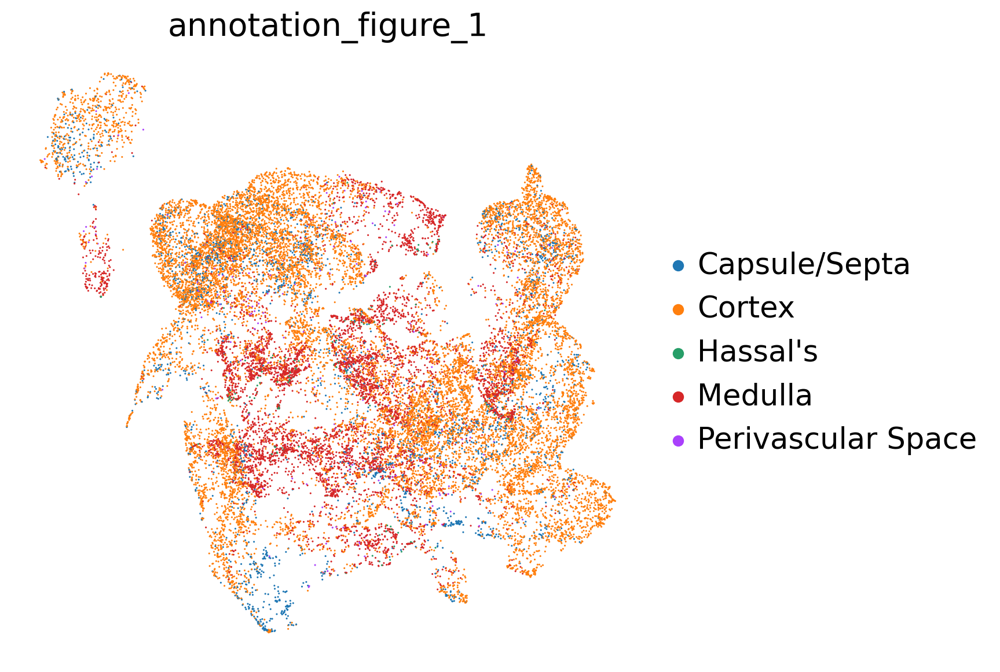

In [30]:
# remove lobules that have less than 4 spots either for medulla or Cortex
# adata_paed_filt = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_paed_filt_v9_sub.h5ad')
adata_paed_filt.layers['counts'] = adata_paed_filt.X
import warnings
warnings.filterwarnings('ignore')

## remove meduala less lobules 
adata_paed_filt.obs['full_lobule'] = 0
for s in adata_paed_filt.obs['SampleID'].cat.categories.tolist():
    sample = adata_paed_filt[adata_paed_filt.obs['SampleID'].isin([s])]
    for l in sample.obs['annotations_lobules_0'].cat.categories:
        lobule = sample.obs['annotations_lobules_0'] == l
        med = np.where(sample.obs['annotation_figure_1'][lobule] == 'Medulla')[0]
        cortex = np.where(sample.obs['annotation_figure_1'][lobule] == 'Cortex')[0]
        if (cortex.size>=4) & (med.size>=4):
            adata_paed_filt.obs['full_lobule'][lobule.iloc[np.where(lobule)].index] = 1
adata_paed_filt.obs['full_lobule'] = adata_paed_filt.obs['full_lobule'].astype('category')
adata_paed_filt.obs['full_lobule'].value_counts()
# adata_paed_filt = adata_paed_filt[adata_paed_filt.obs['full_lobule']==1] # remove spots that don't have either medullar or cortical data
sc.set_figure_params(figsize=[7,7],fontsize=20,dpi=100)
sc.pl.umap(adata_paed_filt, color ='annotation_figure_1', frameon = False,s=5)


In [99]:
adata_paed_cma.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_paed_filt_v9_cma.h5ad')

# explore gene expression 

In [186]:
adata_paed_cma = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_paed_filt_v9_cma.h5ad')

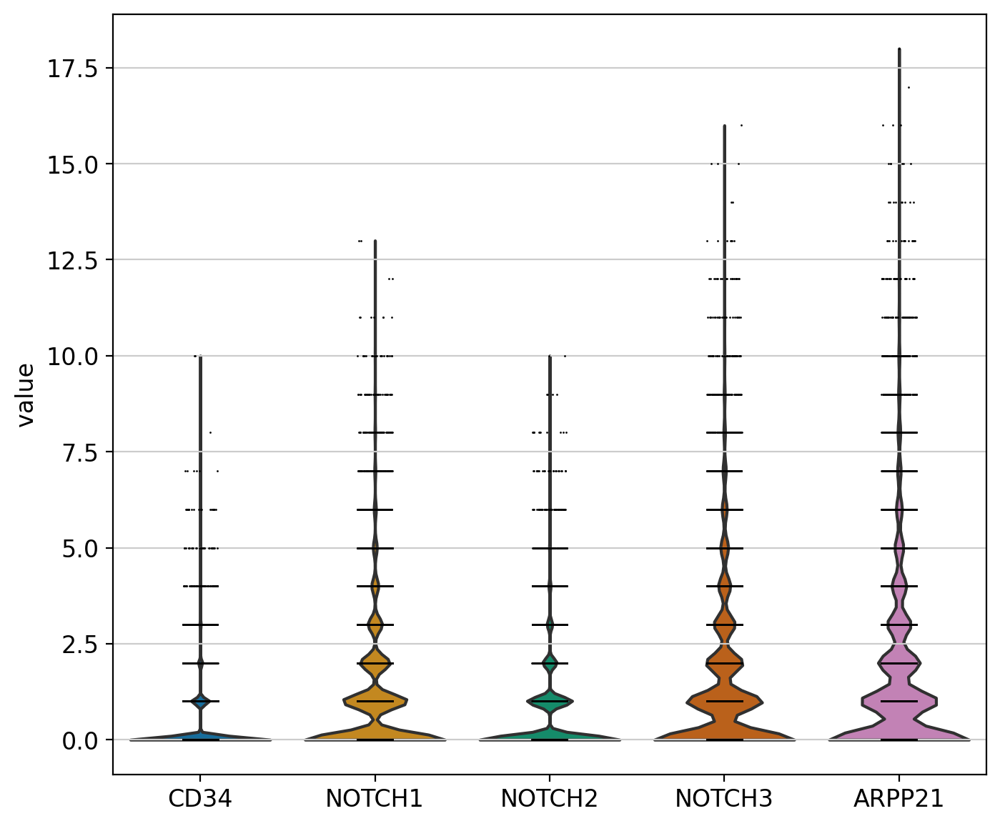

In [178]:
list = ['CD34','NOTCH1','NOTCH2','NOTCH3','ARPP21']
sc.pl.violin(adata_paed_cma, keys =list)

In [215]:
sc.pp.normalize_total(adata_paed_cma,target_sum=3000)
sc.pp.log1p(adata_paed_cma)

In [36]:
adata_paed_filt.obs['manual_bin_cma_v2'] = adata_paed_filt.obs['manual_bin_cma_v2'].astype('category')

ct_order = ['Capsular','Sub-Capsular','Cortical level I','Cortical level II','Cortical level III','Cortical CMJ','Medullar CMJ','Medullar level I','Medullar level II','Medullar level III','Medullar Deep']
adata_paed_filt.obs['manual_bin_cma_v2'] = adata_paed_filt.obs['manual_bin_cma_v2'].cat.reorder_categories(ct_order)
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
adata_paed_filt.obs['manual_bin_cma_v2'].value_counts()
adata_paed_cma =  adata_paed_filt.copy()

Cortical level II     5500
Cortical level I      3726
Sub-Capsular          3070
Capsular              3040
Cortical CMJ          1902
Medullar CMJ          1846
Medullar level I      1446
Cortical level III    1424
Medullar level II     1193
Medullar level III    1069
Medullar Deep          891
Name: manual_bin_cma_v2, dtype: int64

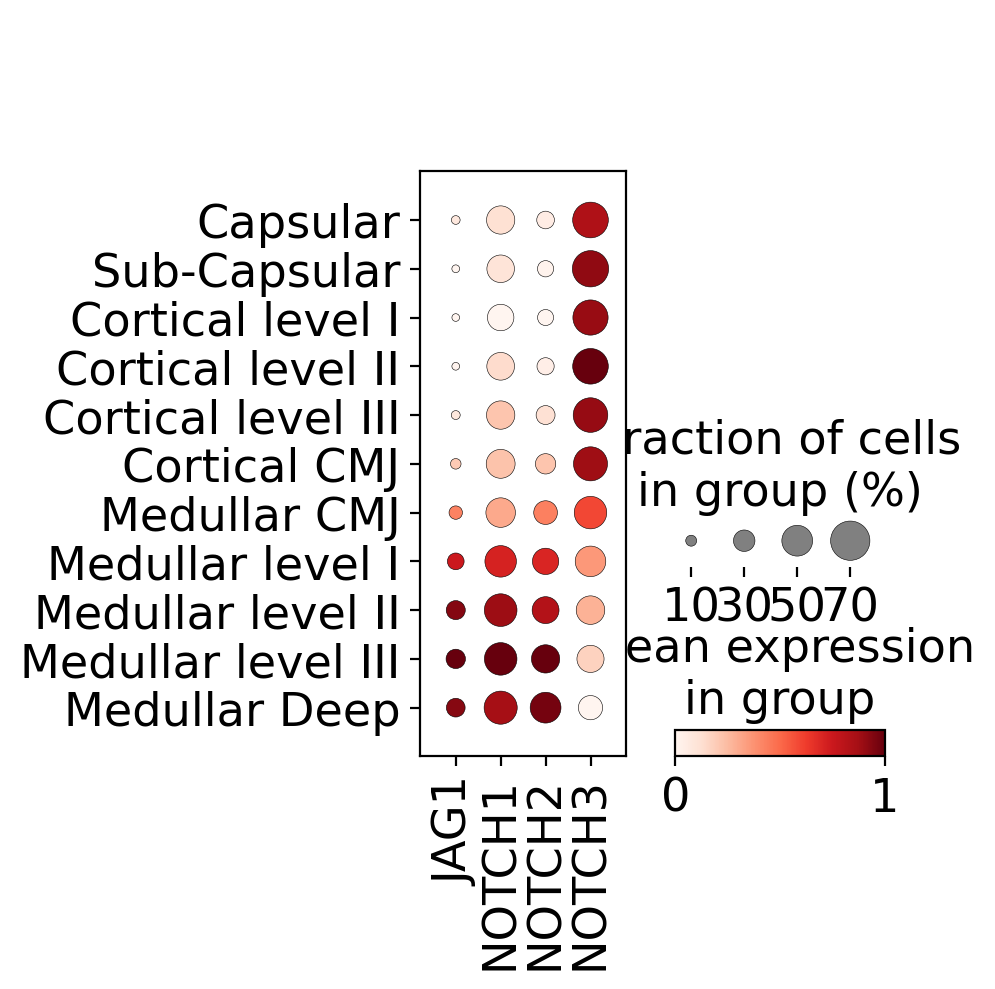

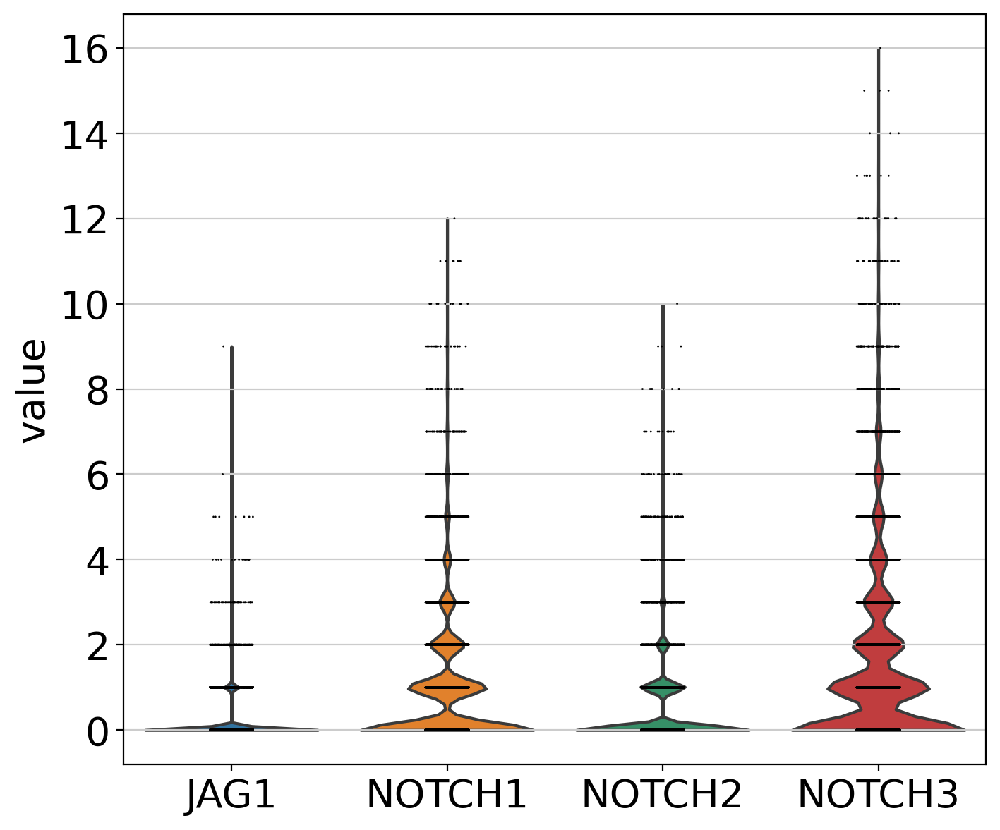

In [37]:
list = ['JAG1','NOTCH1','NOTCH2','NOTCH3']
sc.pl.dotplot(adata_paed_cma,var_names=list,groupby='manual_bin_cma_v2',cmap='Reds',standard_scale='var',
              expression_cutoff=0.1,smallest_dot=5)
sc.pl.violin(adata_paed_cma, keys =list)

In [ ]:
sc.pp.combat(adata_paed_cma, key='SampleID', inplace=True)

Found 251 genes with zero variance.


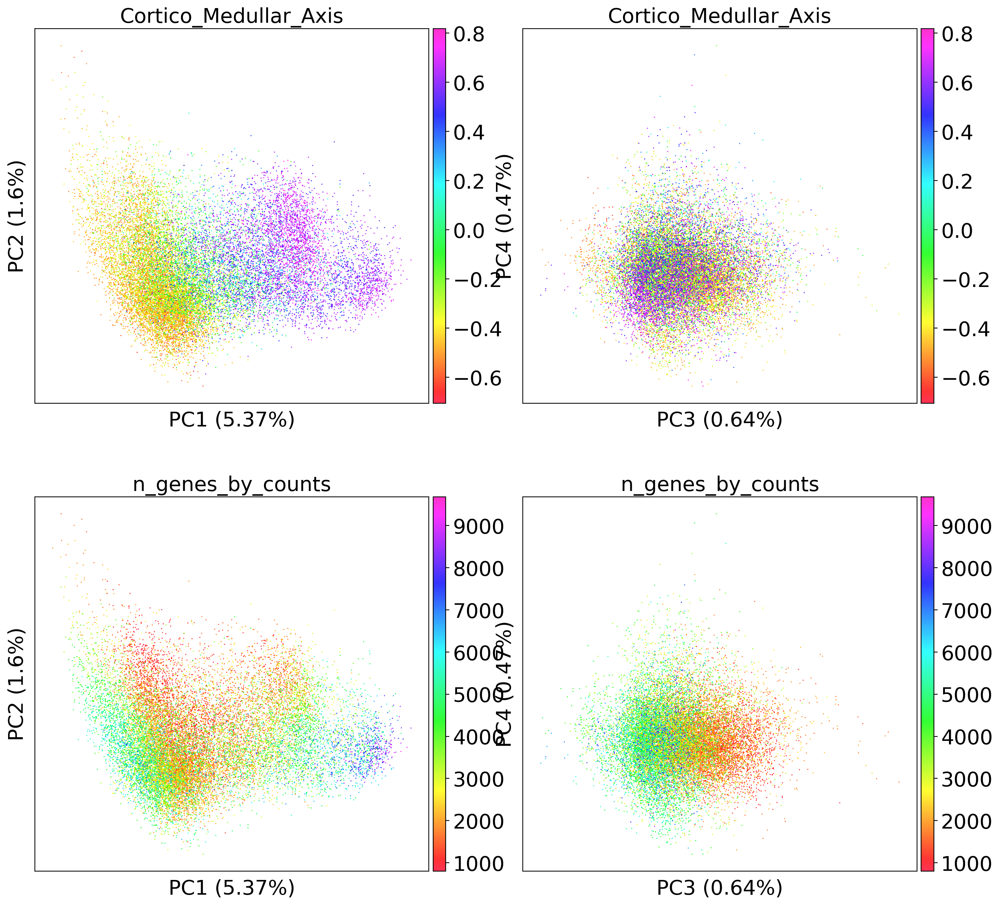

In [28]:
sc.pl.pca(adata_paed_cma, components = ['1,2', '3,4'], color = [ 'cma_v2','n_genes_by_counts'], ncols = 2, cmap = "gist_rainbow",s=5,alpha=0.8,annotate_var_explained=True)

In [29]:
pc_cor_vars = pd.DataFrame(index = ['PC'+ str(i+1) for i in range(0,50)], columns = ['spearmanCount', 'pvalCount', 'spearmanCMA', 'pvalCMA'])

from scipy.stats import spearmanr,pearsonr
from matplotlib import pyplot
for i in range(0, 4):
    pcx = adata_paed_cma.obsm['X_pca'][:, i]
    pc_cor_vars.iloc[i, 0] = np.round(spearmanr(adata_paed_cma.obs['n_genes_by_counts'], pcx)[0],3)
    pc_cor_vars.iloc[i, 1] = np.round(spearmanr(adata_paed_cma.obs['n_genes_by_counts'], pcx)[1],3)
    pc_cor_vars.iloc[i, 2] = np.round(spearmanr(adata_paed_cma.obs['Cortico_Medullar_Axis'], pcx)[0],3)
    pc_cor_vars.iloc[i, 3] = np.round(spearmanr(adata_paed_cma.obs['Cortico_Medullar_Axis'], pcx)[1],3)

pc_cor_vars.iloc[0:4,[2,0]]

,spearmanCMA,spearmanCount
PC1,0.715,0.057
PC2,0.284,-0.198
PC3,-0.056,-0.552
PC4,-0.048,0.009


# Analyse cell level

In [21]:
celltypes = adata_paed_cma.uns['mod']['factor_names']
cellab_paed = sc.AnnData(adata_paed_cma.obs[celltypes], 
                         obs = adata_paed_cma.obs.drop(celltypes, axis = 1),obsm = adata_paed_cma.obsm)

cellab_paed.var_names
sc.pp.normalize_total(cellab_paed,target_sum=1000)


Index(['B(P)', 'B(Q)', 'B-stimulated', 'DC-Prolif', 'DC-a1', 'DC-a3', 'DC1',
       'DC2', 'EC-Art', 'EC-Cap', 'EC-IFI44L', 'EC-Ven', 'EC-Ven-VCAN', 'ETP',
       'Macrophage-CD163', 'Macrophage-CD68', 'Monocyte', 'Neutrophil',
       'PeriloFb', 'RBC', 'SMC', 'TEC-cilliated', 'TEC-myo', 'TEC-neuro',
       'T_CD4', 'T_CD8', 'T_CD8αα(I)', 'T_CD8αα(II)', 'T_CD8αα(entry)',
       'T_DN(CD4)', 'T_DN(P)', 'T_DN(Q)', 'T_DN(Q)-early', 'T_DN(early)',
       'T_DP(P)', 'T_DP(Q)', 'T_DP(Q)-CD99', 'T_NK', 'T_reg', 'T_reg(agonist)',
       'T_reg(diff)-FOXP3Lo', 'T_reg(diff)-FOXP3hi', 'T_αβT(entry)', 'T_γδT',
       'cTECI', 'cTECII', 'cTECIII', 'mTECI', 'mTECI-trans', 'mTECII',
       'mTECIII', 'mcTEC', 'medFb-PDGFRAlo', 'medFb-RGS5', 'plasma-cells'],
      dtype='object')

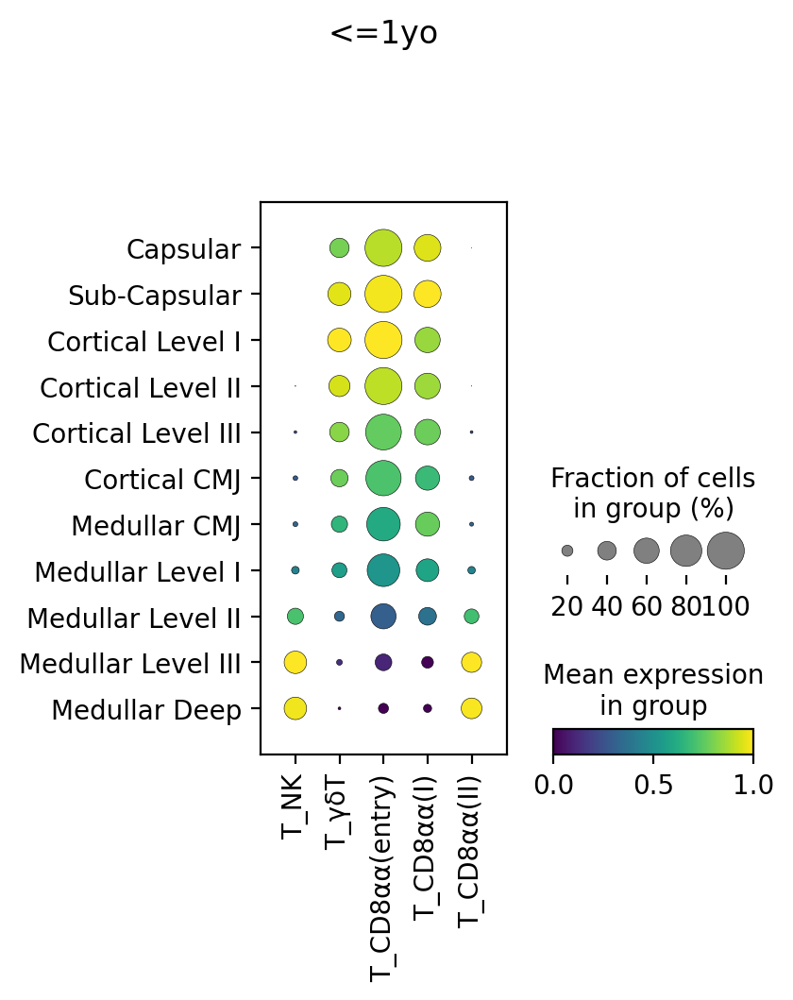

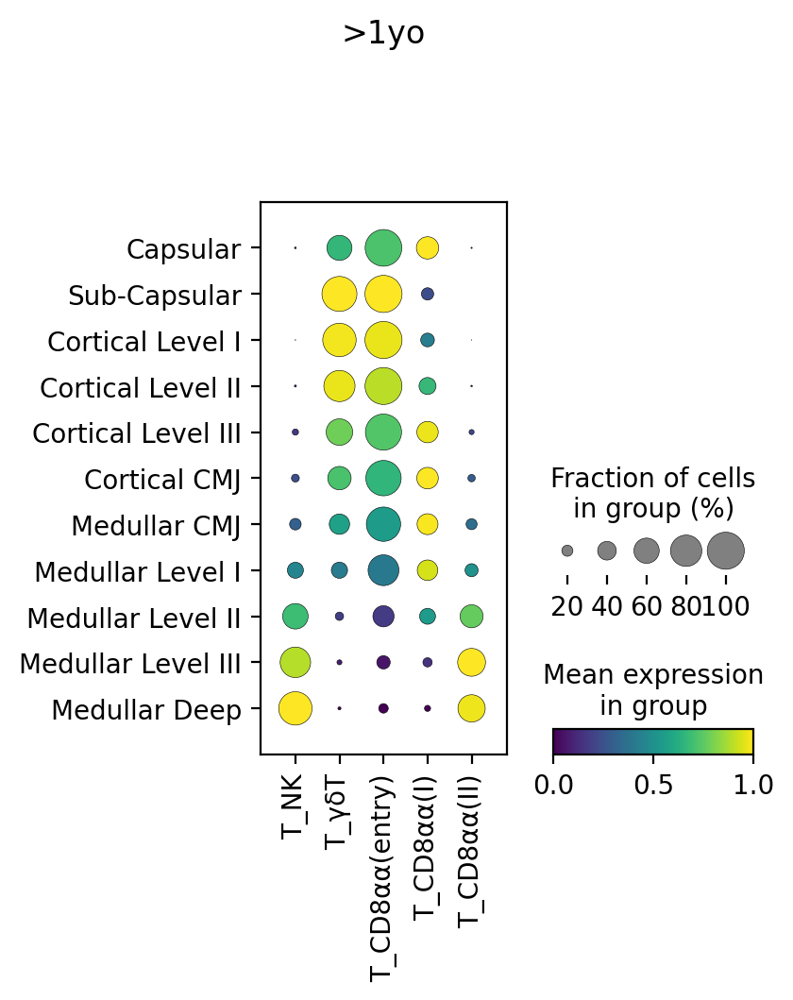

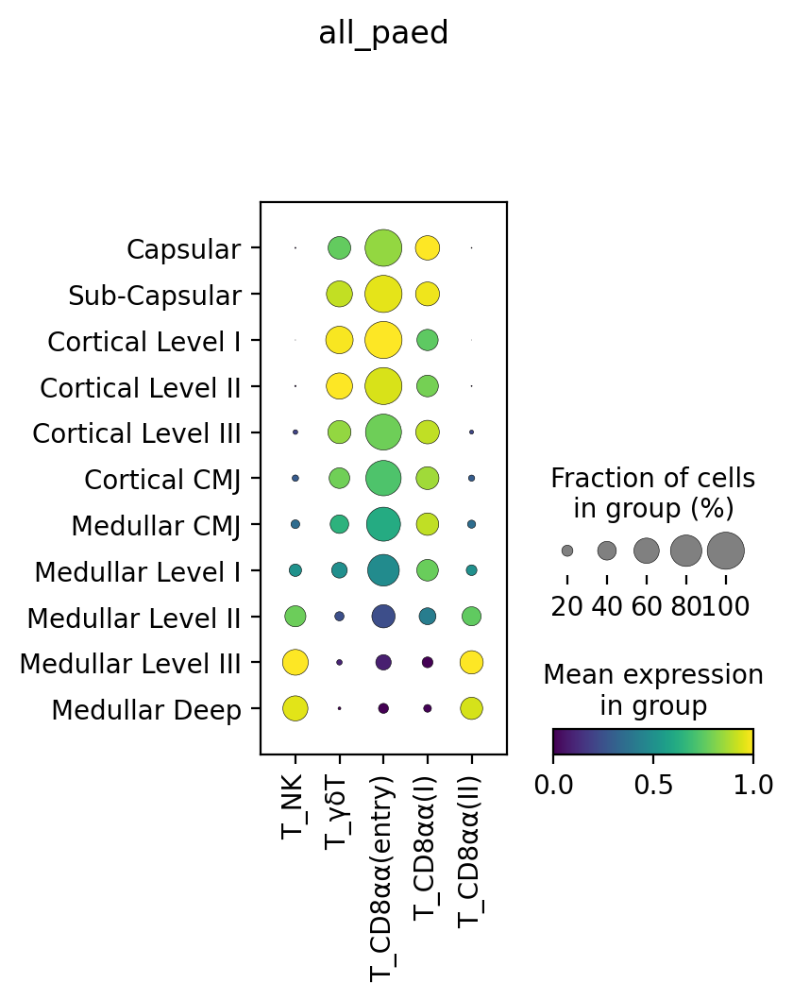

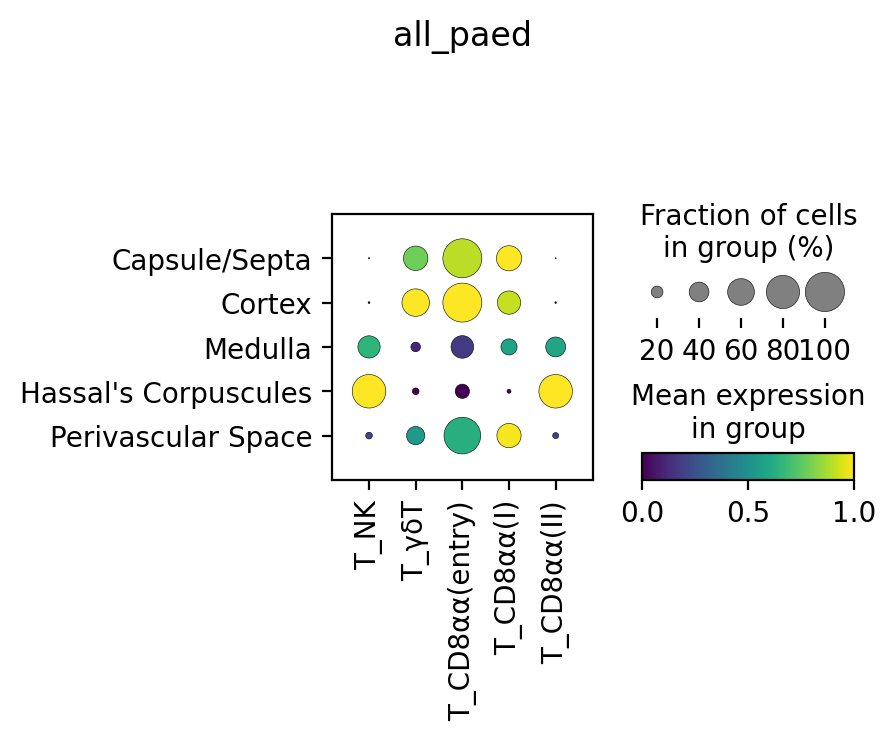

In [59]:
# cells = ['cTECIII','cTECII','cTECI','mcTEC','mTECI','mTECII','mTECIII']
# cells = [  'DC-Prolif','DC-a1', 'DC1', 'DC2','DC-a3']
# cells = ['T_reg(agonist)', 'T_reg(diff)-FOXP3Lo','T_reg(diff)-FOXP3hi','T_reg',]
# cells = ['B(P)', 'B(Q)', 'B-stimulated']
# cells = ['PeriloFb',  'medFb-PDGFRAlo', 'medFb-RGS5']
# cells = ['ETP','T_DN(early)','T_DN(P)','T_DN(Q)-early','T_DN(Q)','T_DN(CD4)', 'T_DP(P)','T_DP(Q)','T_DP(Q)-CD99','T_αβT(entry)','T_CD4', 'T_CD8',]
# cells = ['EC-Art','EC-Cap', 'EC-IFI44L', 'EC-Ven','EC-Ven-VCAN']
# cells = ['TEC-myo', 'TEC-neuro', 'TEC-cilliated','mTECI-trans']
cells = ['T_NK','T_γδT','T_CD8αα(entry)','T_CD8αα(I)','T_CD8αα(II)']
cutoff = 15
sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=100)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_paed[cellab_paed.obs['Age(numeric)']<=12],var_names=cells,
               groupby='cma_bin_manual',cmap='viridis',standard_scale='var',expression_cutoff=cutoff,save='paed_c2l_12minus.pdf',title='<=1yo')

sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=100)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_paed[cellab_paed.obs['Age(numeric)']>12],var_names=cells,
               groupby='cma_bin_manual',cmap='viridis',standard_scale='var',expression_cutoff=cutoff,save='paed_c2l_12plus.pdf',title='>1yo')

sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=100)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_paed,var_names=cells,
               groupby='cma_bin_manual',cmap='viridis',standard_scale='var',expression_cutoff=cutoff,save='paed_c2l_all.pdf',title='all_paed')

sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=100)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_paed,var_names=cells,
               groupby='annotation_figure_1',cmap='viridis',standard_scale='var',expression_cutoff=cutoff,save='paed_c2l_all_anno1.pdf',title='all_paed')


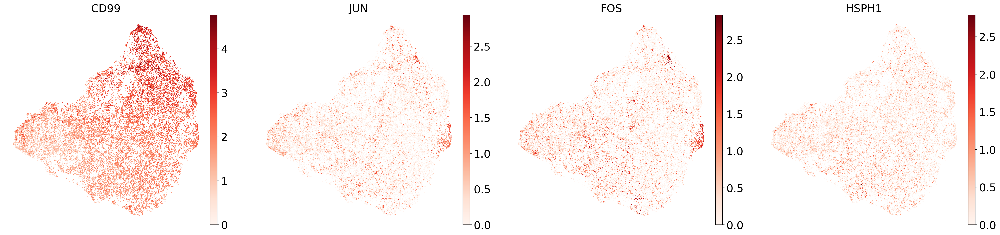

In [216]:
sc.pl.umap(adata_paed_cma, color = ['CD99','JUN','FOS','HSPH1'],s=10, frameon = False, cmap = 'Reds')


# distance measurments 


In [221]:
import seaborn as sns
# cellab_paed = cellab_paed[cellab_paed.obs['tot_cell_abundance']>40,:]

from sklearn.linear_model import LinearRegression
# cellab_paed.obs['L2_dist_log10_Annotation_lv_0_Medulla'] = np.log10(cellab_paed.obs['L2_dist_Annotation_lv_0_Medulla'])
# cellab_paed.obs['L2_dist_log10_Annotation_lv_0_Cortex'] = np.log10(cellab_paed.obs['L2_dist_Annotation_lv_0_Cortex'])
cellab_paed.obs['L2_dist_log10_Annotation_lv_0_Edge'] = np.log10(cellab_paed.obs['L2_dist_Annotation_lv_0_Edge'])
cellab_paed.obs['L2_dist_Annotation_lv_1_HS'] = np.power(10,cellab_paed.obs['L2_dist_log10_Annotation_lv_1_HS'])
cellab_paed.obs['L2_dist_Annotation_lv_1_PVS'] = np.power(10,cellab_paed.obs['L2_dist_log10_Annotation_lv_1_PVS'])

cellab_paed_edge = cellab_paed[cellab_paed.obs['annotation_figure_1'].isin(['Cortex'])]


df = cellab_paed_edge.obs
# df = df.iloc[:,df.columns.isin(['L2_dist_log10_Annotation_lv_0_Cortex', 'L2_dist_log10_Annotation_lv_0_Edge', 'L2_dist_log10_Annotation_lv_0_Medulla', 'L2_dist_log10_Annotation_lv_1_HS', 'L2_dist_log10_Annotation_lv_1_PVS'])]
df = df.iloc[:,df.columns.isin(['L2_dist_Annotation_lv_0_Edge'])]

R_sq = pd.DataFrame(index =df.columns, columns=[cellab_paed_edge.var_names])
R_sq

,B(P),B(Q),B-stimulated,DC-Prolif,DC-a1,DC-a3,DC1,DC2,EC-Art,EC-Cap,EC-IFI44L,EC-Ven,EC-Ven-VCAN,ETP,Macrophage-CD163,Macrophage-CD68,Monocyte,Neutrophil,PeriloFb,RBC,SMC,TEC-cilliated,TEC-myo,TEC-neuro,T_CD4,T_CD8,T_CD8αα(I),T_CD8αα(II),T_CD8αα(entry),T_DN(CD4),T_DN(P),T_DN(Q),T_DN(Q)-early,T_DN(early),T_DP(P),T_DP(Q),T_DP(Q)-CD99,T_NK,T_reg,T_reg(agonist),T_reg(diff)-FOXP3Lo,T_reg(diff)-FOXP3hi,T_αβT(entry),T_γδT,cTECI,cTECII,cTECIII,mTECI,mTECI-trans,mTECII,mTECIII,mcTEC,medFb-PDGFRAlo,medFb-RGS5,plasma-cells
L2_dist_Annotation_lv_0_Edge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [222]:
warnings.filterwarnings('always')

from scipy.stats import spearmanr
from matplotlib import pyplot
for v,var in enumerate(cellab_paed_edge.var_names.to_list()):
    for o,obs in enumerate(df.columns):
        # print(o)
        x = np.array(df[obs])
        nans = np.where(~np.isnan(x))[0]
        x = np.squeeze(np.reshape(x[nans],[-1,1]))
        y = np.squeeze(np.array(cellab_paed_edge[:,cellab_paed_edge.var_names == var].X))[nans]
        idx = np.where((x>0) | (y>np.quantile(y,0.95)))[0]
        R_sq.iloc[o,v] = np.round(spearmanr(x[idx], y[idx])[0],3)
        # print(np.round(spearmanr(x, y)[0],3))
   

<Figure size 400x400 with 0 Axes>

(-50.0, 500.0)

(-50.0, 500.0)

(-50.0, 500.0)

(-50.0, 500.0)

(-50.0, 500.0)

(-50.0, 500.0)

Text(0.5, 0, 'Distance to Nearest hs')

Text(0, 0.5, 'Integrated cell proportion')

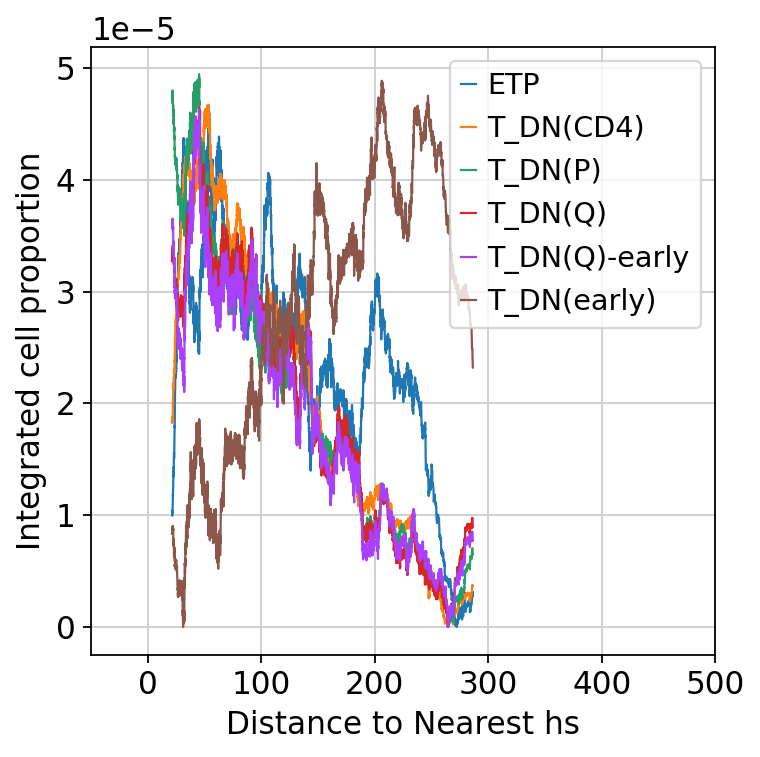

In [234]:
import warnings
sc.set_figure_params(figsize=[7,7])
# del range 
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
plt.figure(figsize=[5,5])

# selected_cells = ['mTECII','mTECI','T_CD8αα(II)','T_reg(diff)-FOXP3Lo']
# selected_cells = [ 'T_CD8αα(II)','T_CD4', 'T_CD8']
# selected_cells = [ 'T_CD8αα(II)','T_CD4', 'T_CD8']

# selected_cells = ['DC1','DC2','CD4+T']
# selected_cells = [ 'DC-a1', 'DC-a3', 'DC1','DC2']
# selected_cells = [ 'T_reg', 'T_reg(agonist)',,'T_reg(diff)-FOXP3hi','T_CD4', 'T_CD8']
# selected_cells = ['B(P)', 'B(Q)', 'B-stimulated',]

selected_cells = ['ETP','T_DN(CD4)','T_DN(P)','T_DN(Q)','T_DN(Q)-early','T_DN(early)']



maxX = 1000
# selected_cells = ['mTECIII']

# for v,var in enumerate(cellab_paed.var_names[-6]):
for v,var in enumerate(selected_cells):

    for o,obs in enumerate(df.columns):
        x = np.array(df[obs])
        nans = np.squeeze(np.isnan([cellab_paed_edge[:,cellab_paed_edge.var_names == var].X])) # ignore nans 
        indx = np.argsort(np.squeeze(np.reshape(x[~nans],[-1,1])))
        x = np.squeeze(np.reshape(x[~nans],[-1,1]))[indx]
        y = np.squeeze(np.array(cellab_paed_edge[:,cellab_paed_edge.var_names == var].X))[~nans][indx]
        idx = np.where((x<maxX) & (y>np.quantile(y,0)))[0]
        window = 500
        average_y = []
        for ind in range(len(y[idx]) - window + 1):
            average_y.append(np.mean(y[idx][ind:ind+window]))
        # sns.regplot(average_y[idx],average_y,scatter=False,robust=True)
        # cs = CubicSpline(x, y[indx])
        # x_range = np.arange(min(x), max(x), 0.1)
        plt.plot(x[idx][:-(window-1)], (average_y)/np.sum(average_y)-np.min(average_y)/np.sum(average_y), label=var,linewidth=1)
        plt.xlim(-50,maxX-window)
        # plt.scatter(x,y,s=1)
        # plt.title(var)
        
        # model = LinearRegression().fit(x, y)
        # R_sq.iloc[o,v] = model.score(x, y)
plt.legend()
plt.xlabel('Distance to Nearest hs')
plt.ylabel('Integrated cell proportion')
plt.show()       
        

In [232]:
import seaborn as sns
R_sq = R_sq.astype('float32').T
plt.figure(figsize=[4,20])
R_sq

<Figure size 320x1600 with 0 Axes>

,B(P),B(Q),B-stimulated,DC-Prolif,DC-a1,DC-a3,DC1,DC2,EC-Art,EC-Cap,EC-IFI44L,EC-Ven,EC-Ven-VCAN,ETP,Macrophage-CD163,Macrophage-CD68,Monocyte,Neutrophil,PeriloFb,RBC,SMC,TEC-cilliated,TEC-myo,TEC-neuro,T_CD4,T_CD8,T_CD8αα(I),T_CD8αα(II),T_CD8αα(entry),T_DN(CD4),T_DN(P),T_DN(Q),T_DN(Q)-early,T_DN(early),T_DP(P),T_DP(Q),T_DP(Q)-CD99,T_NK,T_reg,T_reg(agonist),T_reg(diff)-FOXP3Lo,T_reg(diff)-FOXP3hi,T_αβT(entry),T_γδT,cTECI,cTECII,cTECIII,mTECI,mTECI-trans,mTECII,mTECIII,mcTEC,medFb-PDGFRAlo,medFb-RGS5,plasma-cells
L2_dist_Annotation_lv_0_Edge,0.259,0.223,0.239,0.2,0.24,0.265,0.175,0.223,0.032,-0.154,0.01,0.05,-0.04,-0.073,-0.07,0.101,-0.102,-0.024,-0.056,-0.072,0.004,-0.06,0.059,-0.05,0.229,0.182,-0.035,0.166,-0.162,-0.217,-0.168,-0.114,-0.09,0.083,-0.222,-0.186,-0.192,0.202,0.158,0.224,0.27,0.213,-0.105,-0.108,-0.286,-0.207,-0.144,0.267,0.002,0.25,0.133,-0.02,0.19,0.104,0.234


<Figure size 320x1600 with 0 Axes>

In [233]:
R_sq = R_sq.T
normalized_R_sq=(R_sq-R_sq.min())/(R_sq.max()-R_sq.min())
normalized_R_sq

,L2_dist_Annotation_lv_0_Edge
B(P),0.980216
B(Q),0.915468
B-stimulated,0.944245
DC-Prolif,0.874101
DC-a1,0.946043
DC-a3,0.991007
DC1,0.829137
DC2,0.915468
EC-Art,0.571943
EC-Cap,0.237410


<Figure size 1600x400 with 0 Axes>

<AxesSubplot:ylabel='None'>

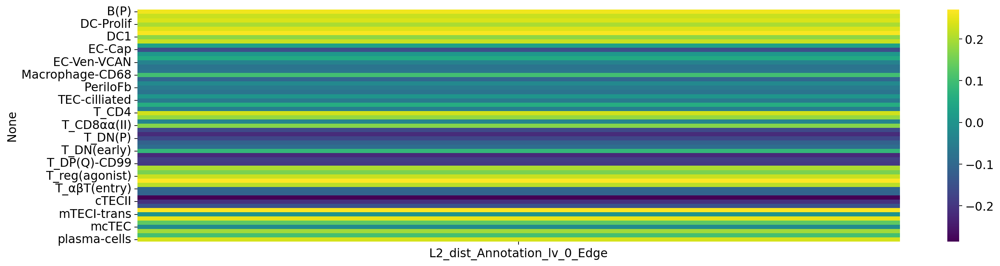

In [235]:
plt.figure(figsize=[20,5])
sns.heatmap(R_sq,cmap='viridis')

In [57]:
sc.pp.neighbors(cellab_paed_med, use_rep="X_scVI")
sc.tl.umap(cellab_paed_med, min_dist = 0.01, spread = 1)
sc.tl.leiden(cellab_paed_med,resolution=0.5,key_added='leiden')


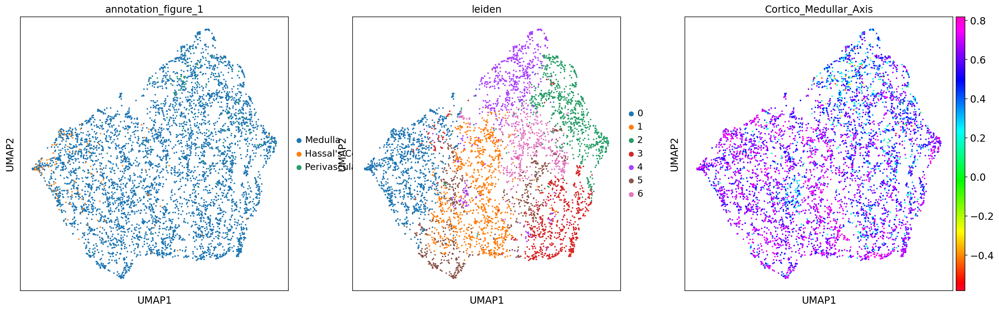

In [62]:
sc.pl.umap(cellab_paed_med,color=['annotation_figure_1','leiden','Cortico_Medullar_Axis'],cmap='gist_rainbow',s=20)

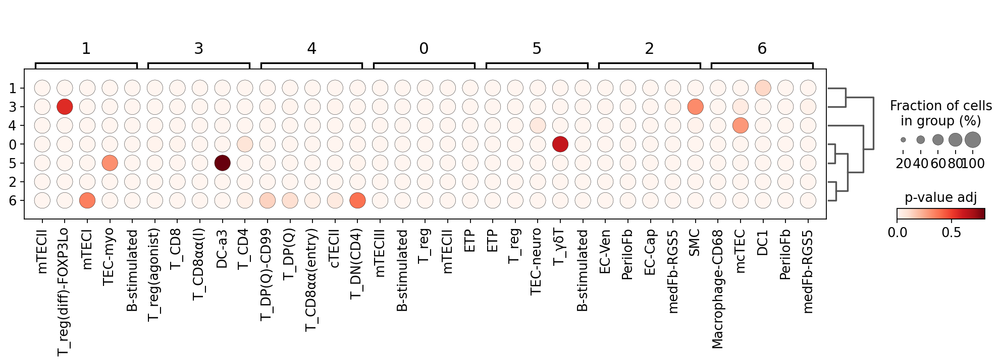

In [73]:
sc.tl.rank_genes_groups(cellab_paed_med, groupby='leiden', method='wilcoxon')
sc.pl.rank_genes_groups_dotplot(cellab_paed_med, n_genes=5,values_to_plot='pvals_adj')

# cluster analysis

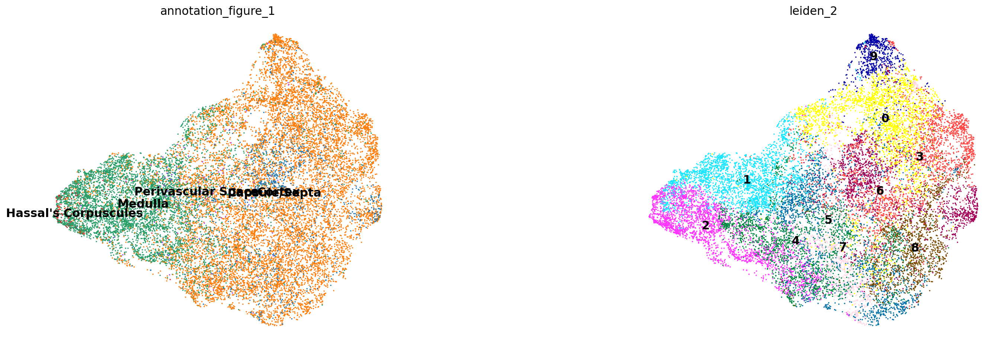

In [311]:
sc.tl.leiden(adata_paed_cma, resolution=0.5,key_added='leiden_2')
sc.pl.umap(adata_paed_cma, color = ['annotation_figure_1','leiden_2'],s=10, frameon = False, cmap = 'Reds',wspace=0.5,legend_loc='on data')


<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

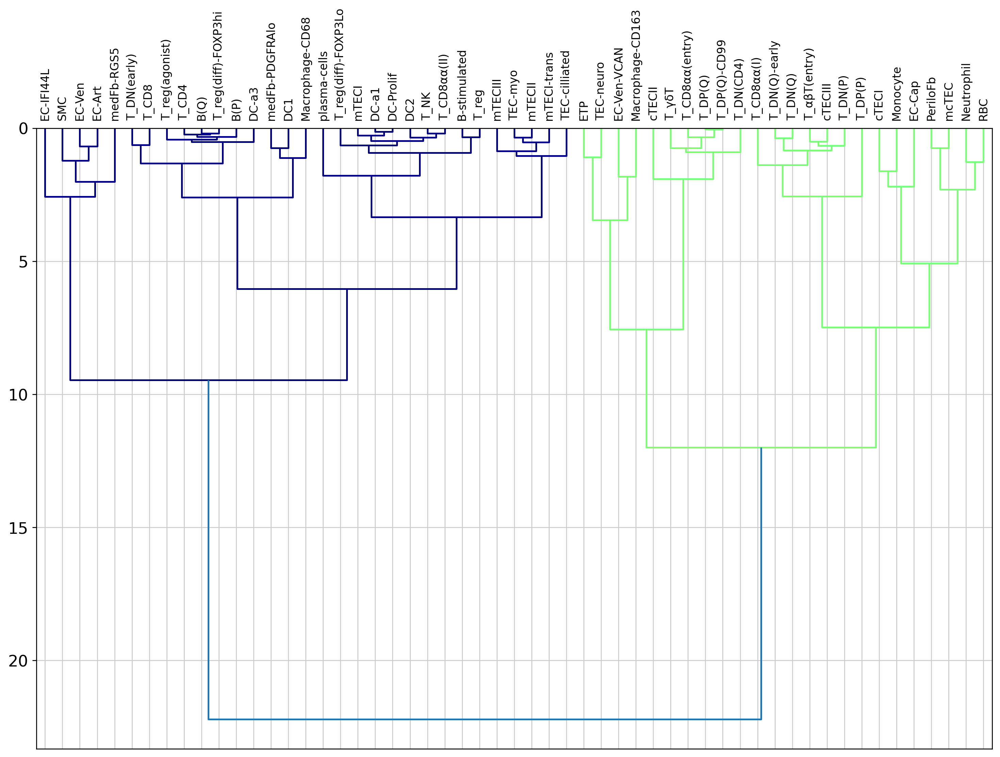

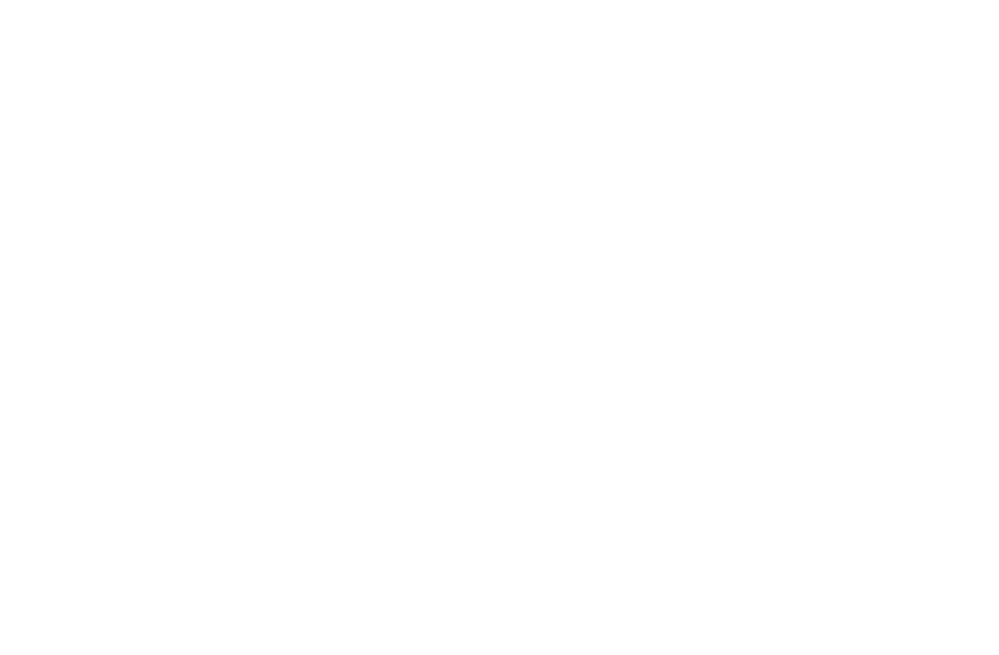

In [312]:
from scipy.cluster.hierarchy import dendrogram, linkage
celltypes = adata_paed_cma.uns['mod']['factor_names']
cellab_paed = sc.AnnData(adata_paed_cma.obs[celltypes], obs = adata_paed_cma.obs.drop(celltypes, axis = 1),obsm = adata_paed_cma.obsm)
df_full = pd.DataFrame(data=cellab_paed.X,columns=cellab_paed.var_names)
df_full['leiden_2'] = cellab_paed.obs['leiden_2'].values
df = df_full.groupby('leiden_2').mean()
# df_full['cma_bin_manual'] = cellab_paed.obs['cma_bin_manual'].values
# df = df_full.groupby('cma_bin_manual').mean()
from scipy.stats import entropy
df_entropy = df.apply(lambda x: entropy(x), axis = 0).sort_values()
from sklearn.preprocessing import MinMaxScaler,StandardScaler
# scaler = MinMaxScaler()
scaler = StandardScaler()

df_scaled = pd.DataFrame(scaler.fit_transform(df), 
                                  index = df.index, 
                                  columns = df.columns)
from scipy.cluster.hierarchy import dendrogram, linkage
linkage_data = linkage(df_scaled.T, optimal_ordering = True, method='ward', metric='euclidean')
plt.figure(figsize=(15,10), dpi=120)
dd = dendrogram(linkage_data, orientation="bottom",leaf_font_size=10,labels=df_scaled.columns)
plt.figure(figsize=(15,10), dpi=120)
# remove the grid lines
plt.grid(False)
# remove the axis labels
plt.axis('off')
#plt.show()
plt.savefig("Paed_dd_ordering.pdf", bbox_inches='tight', transparent = True)

<Figure size 6000x1200 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

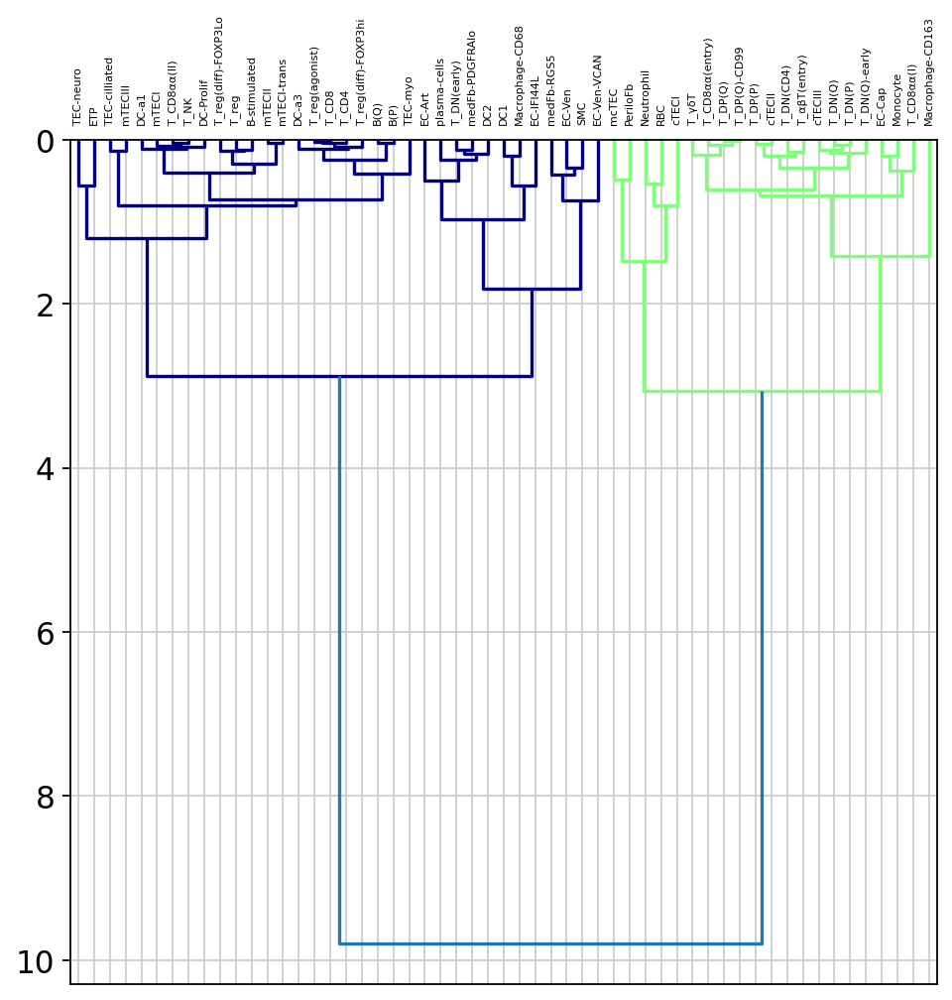

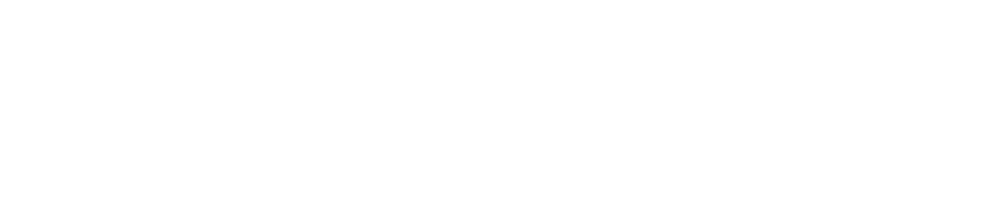

<Figure size 3000x2250 with 0 Axes>

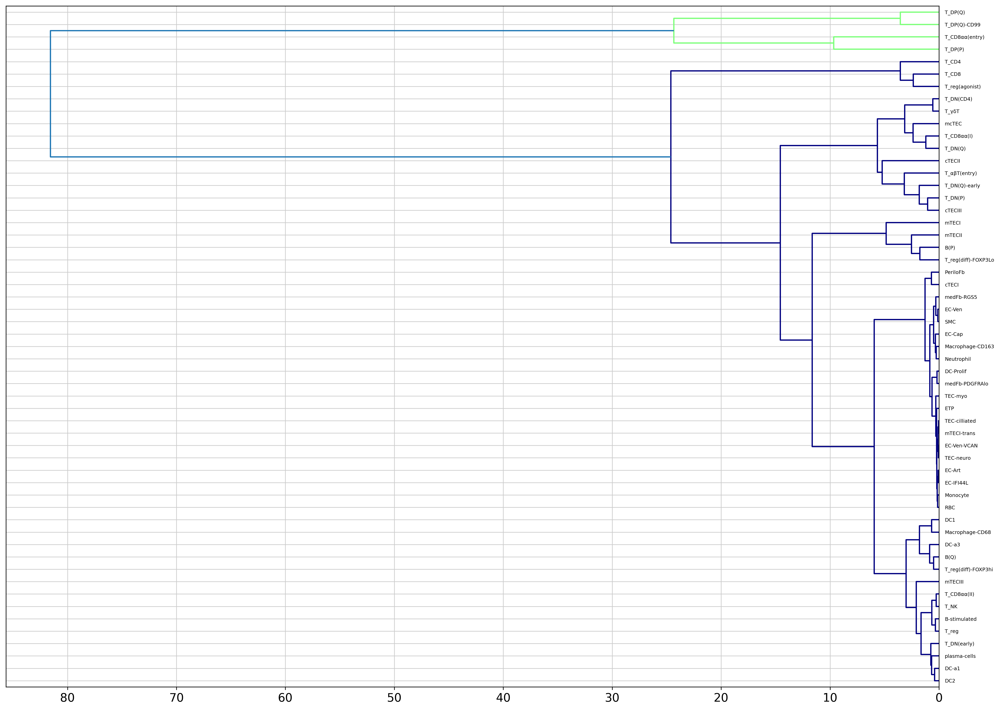

In [272]:
plt.figure(figsize=(20,15), dpi=150)
import matplotlib as mpl
from matplotlib.pyplot import cm
from scipy.cluster import hierarchy
cmap = cm.jet(np.linspace(0, 1, 3))
hierarchy.set_link_color_palette([mpl.colors.rgb2hex(rgb[:3]) for rgb in cmap])
dd = dendrogram(linkage_data, orientation="left", labels=df.columns,distance_sort='descending' )